# Assignment 1 Notebook

# Referene (scRNA-seq)

In [1]:
import pandas as pd
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer/HPF_sort.h5ad")

In [2]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
adata.var["hb"] = adata.var_names.str.startswith(("Hba", "Hbb"))
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)

In [3]:
adata.n_obs

181653

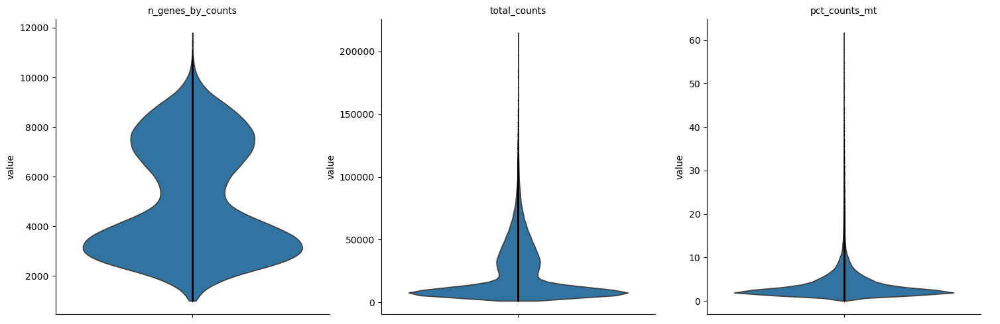

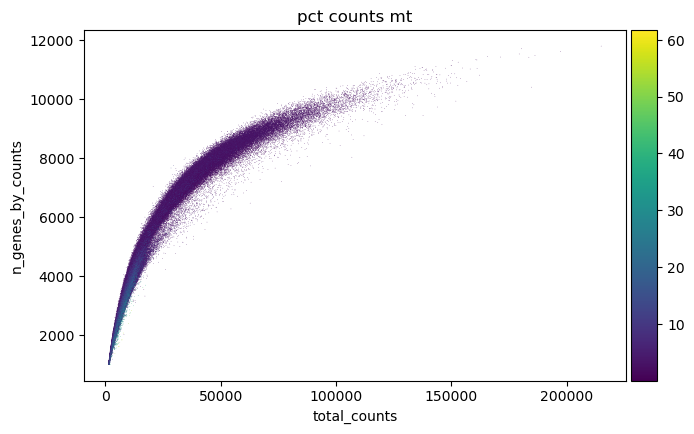

In [4]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.0,
    multi_panel=True,
)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

Before QC: (181653, 32245)


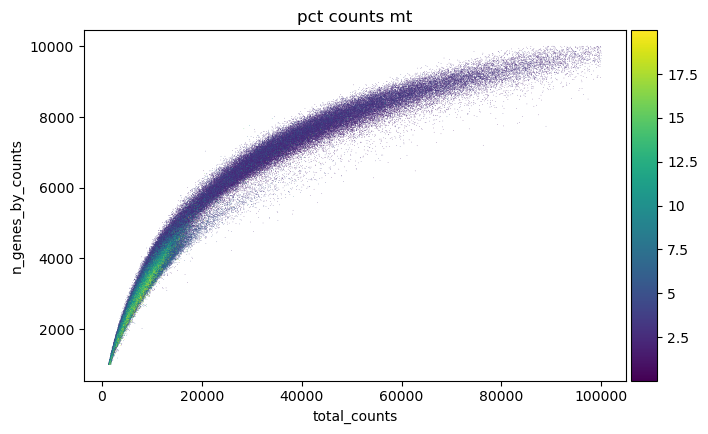

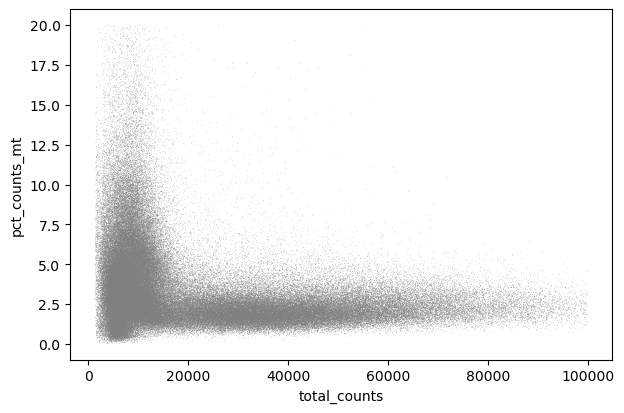

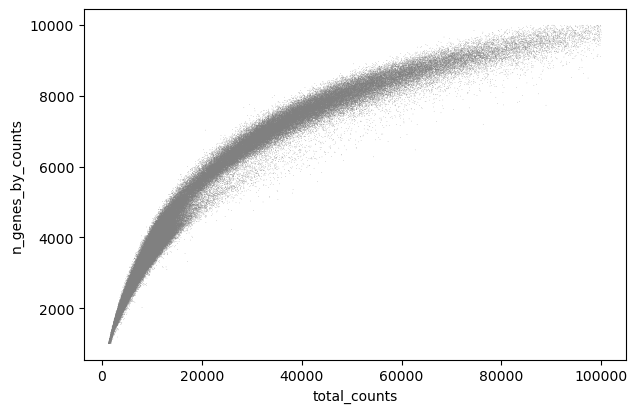

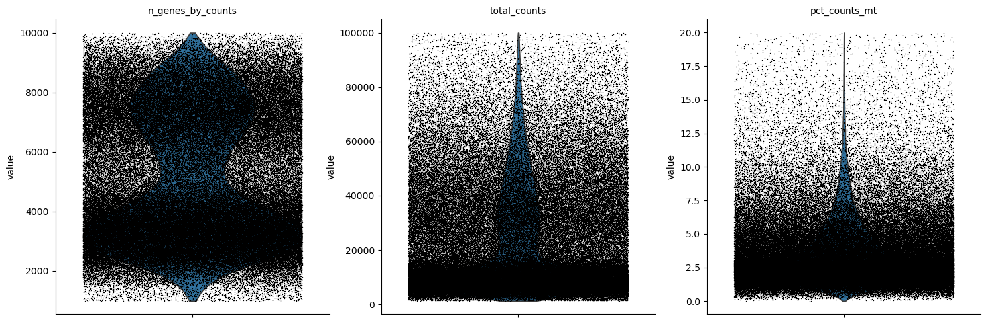

After QC: (179859, 28806)


In [5]:
print("Before QC:", adata.shape)

sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
adata = adata[(adata.obs.n_genes_by_counts <= 10000), :]
adata = adata[adata.obs.pct_counts_mt < 20, :].copy()
adata = adata[(adata.obs.total_counts >= 500) & (adata.obs.total_counts <= 100000), :]

sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)
print("After QC:", adata.shape)

In [8]:
import scrublet
import matplotlib.pyplot as plt
sc.pp.scrublet(adata, batch_key="library_label")
plt.figure(figsize=(6, 4))
plt.hist(adata.obs['doublet_score'], bins=50, color='steelblue', edgecolor='black')
plt.xlabel('Doublet Score')
plt.ylabel('Number of Cells')
plt.title('Distribution of Doublet Scores')
plt.grid(axis='y', alpha=0.3)
plt.show()

In [9]:
adata = adata[adata.obs['predicted_doublet'] == False].copy()
print("After removing doublets:", adata.n_obs)

After removing doublets: 179756


In [10]:
output_path = "/home/Data_Drive_8TB_2/kykim/potrai/scRNA/merge_adata.h5ad"

adata.write(output_path)

In [2]:
import scanpy as sc
file_path = "/home/Data_Drive_8TB_2/kykim/potrai/scRNA/merge_adata.h5ad"
adata = sc.read_h5ad(file_path)

In [3]:
adata.raw = adata.copy()
adata.layers['RNA'] = adata.X

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000)

adata = adata[:, adata.var.highly_variable].copy()

In [4]:
adata = adata[:, adata.var['highly_variable']].copy()

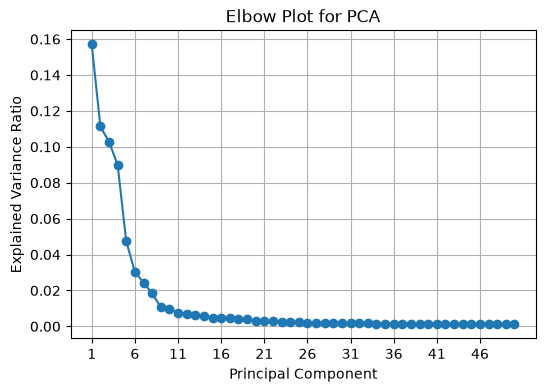

In [5]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [5]:
sc.tl.pca(adata, n_comps=16)

In [7]:
import scvi 
from scvi.model import SCVI

scvi.model.SCVI.setup_anndata(adata, layer="RNA", batch_key="library_label")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[RNA] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/li

Epoch 400/400: 100%|██████████| 400/400 [1:22:20<00:00, 12.85s/it, v_num=1, train_loss=403]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [1:22:20<00:00, 12.35s/it, v_num=1, train_loss=403]


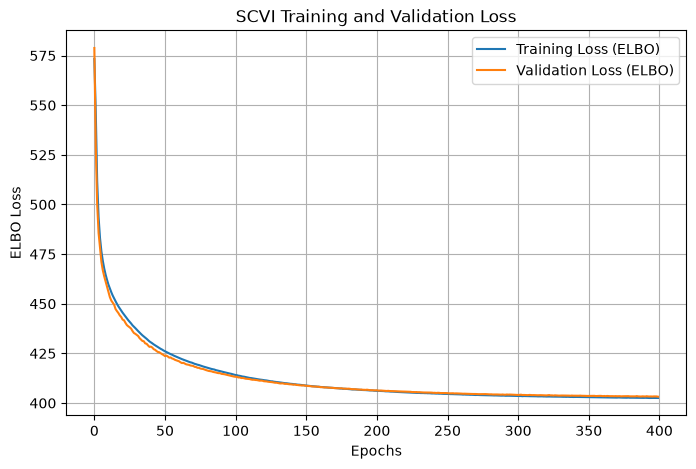

In [8]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

Text(0.5, 1.0, 'scVI')

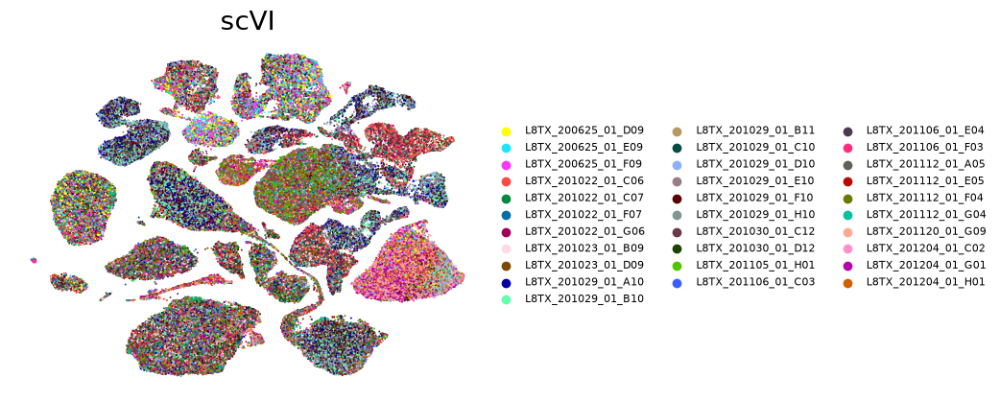

In [9]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=['library_label'],
    frameon=False,
    size= 8,
    legend_fontsize=8,
    legend_fontoutline=3,
    title="Sample",
    show=False)

plt.title("scVI", fontsize=20)

In [10]:
output_path = "/home/Data_Drive_8TB_2/kykim/potrai/scRNA/after_annotate_adata.h5ad"

adata.write(output_path)

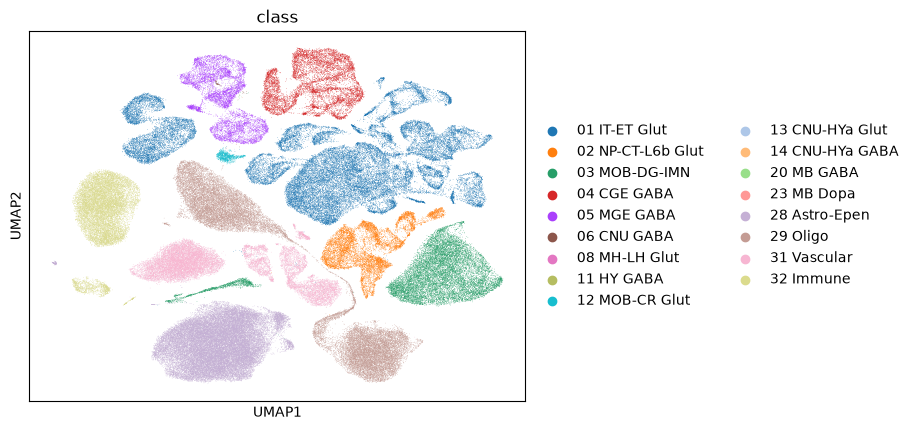

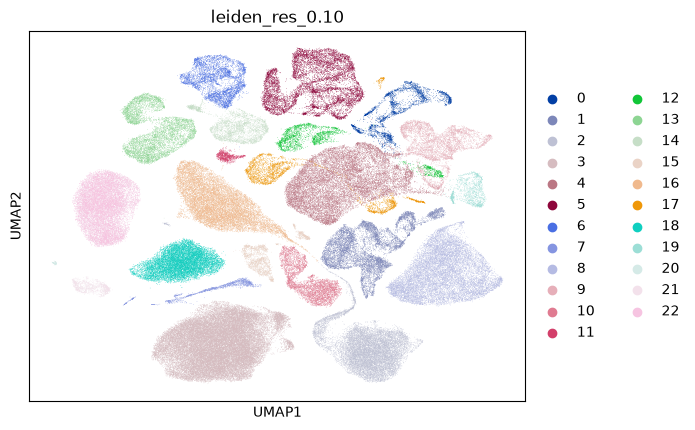

In [31]:
sc.pl.umap(adata, color=["class"])
sc.pl.umap(adata, color=["leiden_res_0.10"])

In [22]:
for res in [0.10, 0.25, 0.50]:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

In [27]:
adata = adata.raw.to_adata()

In [29]:
adata.raw = adata.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [32]:
import scanpy as sc
adata.obs['leiden_res_0.10'] = adata.obs['leiden_res_0.10'].astype('category')
sc.tl.rank_genes_groups(adata, groupby='leiden_res_0.10', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")

/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/Data_Drive_8TB/kykim/.conda/envs/scrna/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: ov

Cluster 0: ['Snhg11', 'Ldb2', 'Ptprd', 'Tshz3', 'Sorbs2', 'Satb2', 'Slc4a10', 'Kalrn', 'Csmd1', 'Kcnq5', 'Nrgn', 'Lrrtm3', 'Csrnp3', 'Celf2', 'Tmem178b', 'Dock3', 'Nav3', 'Phactr1', 'Psd3', 'Arpp21']
Cluster 1: ['Hs3st4', 'Ptprd', 'Prickle1', 'Efhd2', 'Tbr1', 'Etl4', 'Pbx1', 'Arpp21', 'Grik3', 'Rap1gap2', 'Phactr1', 'Adgra1', 'Tle4', 'Adora1', 'Lmo3', 'Kcnma1', 'Pcdh9', 'Myt1l', 'Stxbp1', 'Fut9']
Cluster 2: ['Lhfpl3', 'Olig1', 'Pdgfra', 'Ptprz1', 'Olig2', 'Cacng4', 'Epn2', 'Cspg4', 'C1ql1', 'Arhgap31', 'Xylt1', 'Vcan', 'Sox10', 'Dscam', 'Matn4', 'Sulf2', 'Sh3d19', 'Sox6', 'Sema3d', 'Megf11']
Cluster 3: ['Plpp3', 'Gja1', 'Atp1a2', 'Gpr37l1', 'Slc1a3', 'S1pr1', 'Ntsr2', 'Fgfr3', 'Htra1', 'Slc1a2', 'Acsbg1', 'Hepacam', 'Bcan', 'Nwd1', 'Pla2g7', 'Slc6a11', 'Gm6145', 'Mfge8', 'Ttyh1', 'Gpc5']
Cluster 4: ['Tmsb4x', 'Fkbp1a', 'Grin2b', 'Calm2', 'Gria2', 'Camkv', 'Celf5', 'Gria1', 'Fam131a', 'Arf1', 'Wasf1', 'Camk2a', 'Calm3', 'Nsg2', 'Tspan13', 'Atp2b1', 'Nrgn', 'Scn8a', 'Snhg11', 'Ptk2b']
Cl

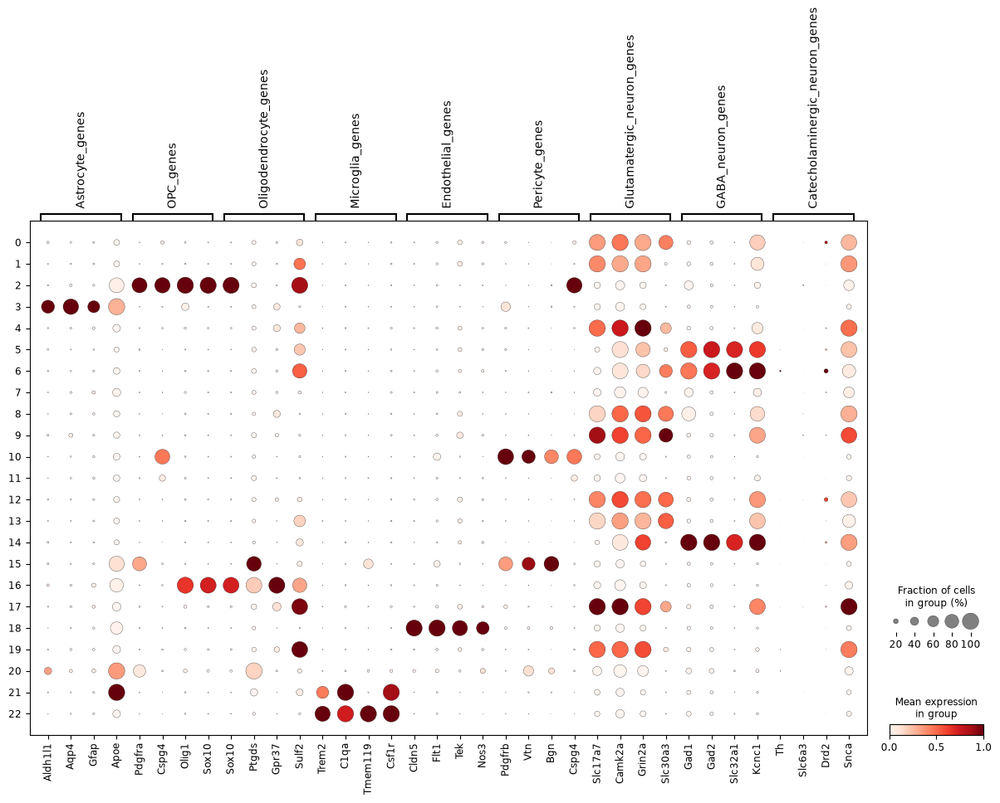

In [30]:
import scanpy as sc

group_markers = {
    "Astrocyte_genes": ['Aldh1l1','Aqp4','Gfap','Apoe'],
    "OPC_genes": ['Pdgfra','Cspg4','Olig1','Sox10'],
    "Oligodendrocyte_genes": ['Sox10','Ptgds','Gpr37','Sulf2'],
    "Microglia_genes": ['Trem2','C1qa','Tmem119','Csf1r'],
    "Endothelial_genes": ['Cldn5','Flt1','Tek','Nos3'],
    "Pericyte_genes": ['Pdgfrb','Vtn','Bgn','Cspg4'],
    "Glutamatergic_neuron_genes": ['Slc17a7','Camk2a','Grin2a','Slc30a3'],
    "GABA_neuron_genes": ['Gad1','Gad2','Slc32a1','Kcnc1'],
    "Catecholaminergic_neuron_genes": ['Th','Slc6a3','Drd2','Snca']}

existing_genes = {cat:[gene for gene in genes if gene in adata.var_names] for cat, genes in group_markers.items()}
existing_genes = {cat:genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, var_names=existing_genes, groupby="leiden_res_0.10", standard_scale="var")

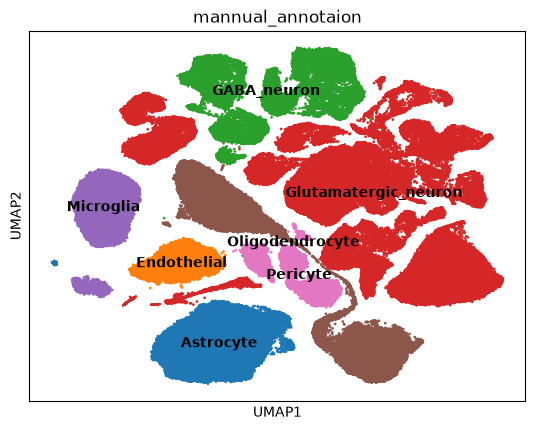

In [37]:
cluster_to_group = {
    0: "Glutamatergic_neuron",      # Satb2, Tshz3, Ptprd
    1: "Glutamatergic_neuron",      # Tbr1, Tle4, Grik3
    2: "Oligodendrocyte",           # Olig1, Olig2, Sox10, Pdgfra
    3: "Astrocyte",                 # Slc1a3, Slc1a2, Gja1, Gpr37l1
    4: "Glutamatergic_neuron",      # Camk2a, Grin2b, Gria1/2
    5: "GABA_neuron",               # Gad1, Slc32a1
    6: "GABA_neuron",               # Gad2, Lhx6, Slc32a1
    7: "Glutamatergic_neuron",      # Dcx, Neurod1, Prox1 (immature DG)
    8: "Glutamatergic_neuron",      # Prox1, Grm1, C1ql3 (DG)
    9: "Glutamatergic_neuron",      # App, Scn2a, Slc12a5
    10: "Pericyte",                 # Pdgfrb, Notch3, Cald1
    11: "GABA_neuron",              # Reln, Ndnf
    12: "Glutamatergic_neuron",     # neuronal markers
    13: "Glutamatergic_neuron",     # Cck+, Tshz2 cortical glut
    14: "GABA_neuron",              # Gad1, Erbb4, Lhx6
    15: "Pericyte",                 # Col1a2, Foxc1, Tgfbr3
    16: "Oligodendrocyte",          # Mbp, Aspa, Myrf, Gpr37
    17: "Glutamatergic_neuron",     # Slc17a7
    18: "Endothelial",              # Flt1, Cldn5, Pecam1
    19: "Glutamatergic_neuron",     # neuronal, excitatory-like
    20: "Astrocyte",                # Kl, Enpp2, Slc12a2 (astro/ependymal)
    21: "Microglia",                # Csf1r, C1qa, Tyrobp
    22: "Microglia"                 # P2ry12, Tmem119, Cx3cr1
}

adata.obs["mannual_annotaion"] = adata.obs["leiden_res_0.10"].astype(int).map(cluster_to_group)

sc.pl.umap(
    adata,
    color='mannual_annotaion',
    legend_loc='on data'
    , s = 15)

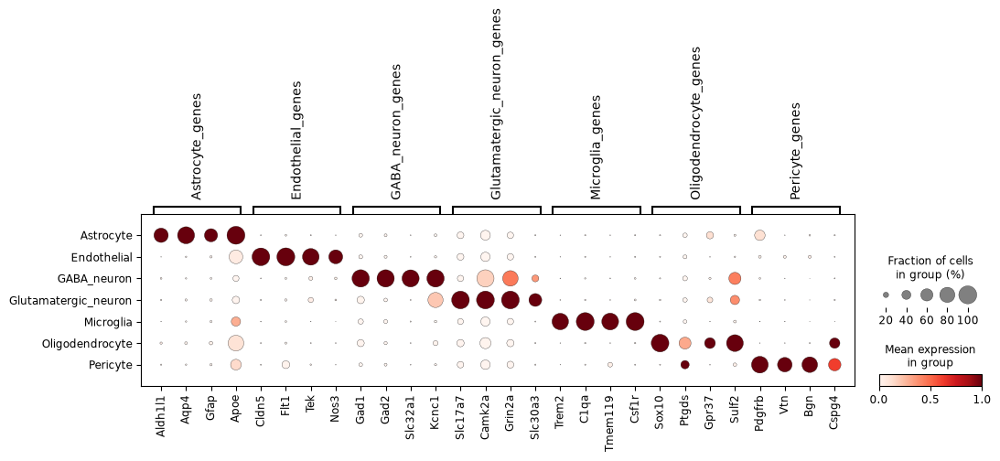

In [39]:
import scanpy as sc

group_markers = {
    "Astrocyte_genes": ['Aldh1l1','Aqp4','Gfap','Apoe'],
    "Endothelial_genes": ['Cldn5','Flt1','Tek','Nos3'],
    "GABA_neuron_genes": ['Gad1','Gad2','Slc32a1','Kcnc1'],
    "Glutamatergic_neuron_genes": ['Slc17a7','Camk2a','Grin2a','Slc30a3'],
    "Microglia_genes": ['Trem2','C1qa','Tmem119','Csf1r'],
    "Oligodendrocyte_genes": ['Sox10','Ptgds','Gpr37','Sulf2'],
    "Pericyte_genes": ['Pdgfrb','Vtn','Bgn','Cspg4']  
}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, var_names=existing_genes, groupby="mannual_annotaion", standard_scale="var")

In [40]:
output_path = "/home/Data_Drive_8TB_2/kykim/potrai/scRNA/after_annotate_adata.h5ad"

adata.write(output_path)

In [44]:
adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/scRNA/after_annotate_adata.h5ad")

# Import & Preprocess (Merscope)

In [13]:
import json
from urllib.request import urlopen

import anndata as ad
import numpy as np
import pandas as pd
import tifffile


def load_bil_merscope_region(base, z_plane=3, load_image=False):
    counts = pd.read_csv(
        f'{base}/cellpose_cell_by_gene.csv',
        index_col=0
    )

    meta = pd.read_csv(
        f'{base}/cellpose_cell_meta_data.csv',
        index_col=0
    ).loc[counts.index]

    manifest = json.load(
        urlopen(f'{base}/images/manifest.json')
    )

    transform = pd.read_csv(
        f'{base}/images/micron_to_mosaic_pixel_transform.csv',
        header=None
    ).values

    adata = ad.AnnData(counts)
    adata.obs = meta

    adata.obsm['spatial'] = meta[['center_x', 'center_y']].to_numpy(np.float32)

    image_info = {
        'z_plane': z_plane,
        'url': f'{base}/images/mosaic_DAPI_z{z_plane}.tif',
        'loaded': False,
        'shape': None
    }

    if load_image:
        try:
            img = tifffile.imread(image_info['url'])
            image_info['loaded'] = True
            image_info['shape'] = img.shape
            adata.uns['dapi'] = img
        except Exception:
            pass

    adata.uns['spatial'] = {
        'source': 'Brain Image Library (BIL)',
        'region_url': base,
        'manifest': manifest,
        'micron_to_mosaic_pixel_transform': transform,
        'image': image_info
    }

    return adata

In [57]:
#################################################################
############################# 5xFAD #############################
#################################################################

In [14]:
base0 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_0/'
base1 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_1/'
base2 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_2/'
base3 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_3/'


adata0 = load_bil_merscope_region(base0)
adata1 = load_bil_merscope_region(base1)
adata2 = load_bil_merscope_region(base2)
adata3 = load_bil_merscope_region(base3)

In [16]:
import os

outdir = "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05"

os.makedirs(outdir, exist_ok=True)

for adata, name in zip(
    [adata0, adata1, adata2, adata3],
    ["region_0.h5ad", "region_1.h5ad", "region_2.h5ad", "region_3.h5ad"]
):
    if "spatial" in adata.uns:
        adata.uns.pop("spatial")

    adata.write_h5ad(
        os.path.join(outdir, name),
        compression="gzip"
    )

    print(f"saved: {os.path.join(outdir, name)}")

saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_0.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_1.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_2.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_3.h5ad


In [58]:
#################################################################
############################### WT ##############################
#################################################################

In [10]:
base0 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_0/'
base1 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_1/'
base2 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_2/'
base3 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_3/'


adata0 = load_bil_merscope_region(base0)
adata1 = load_bil_merscope_region(base1)
adata2 = load_bil_merscope_region(base2)
adata3 = load_bil_merscope_region(base3)

In [12]:
import os

outdir = "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/"

os.makedirs(outdir, exist_ok=True)

for adata, name in zip(
    [adata0, adata1, adata2, adata3],
    ["region_0.h5ad", "region_1.h5ad", "region_2.h5ad", "regrion_3.h5ad"]
):
    if "spatial" in adata.uns:
        adata.uns.pop("spatial")

    adata.write_h5ad(
        os.path.join(outdir, name),
        compression="gzip"
    )

    print(f"saved: {os.path.join(outdir, name)}")

saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_0.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_1.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_2.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/regrion_3.h5ad


In [17]:
import scanpy as sc
import pandas as pd

data_info = [
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_0.h5ad",
        "sample_id": "WT1",
        "genotype": "WT",
        "strain": "C57BL6",
        "sex": "Female",
        "age": "12.0 months",
        "region_location": "Posterior Hippocampus",
        "region_short": "pHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_1.h5ad",
        "sample_id": "5xFAD1",
        "genotype": "5xFAD",
        "strain": "5xFAD (C57BL6 background)",
        "sex": "Female",
        "age": "12.0 months",
        "region_location": "Posterior Hippocampus",
        "region_short": "pHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_1.h5ad",
        "sample_id": "WT3",
        "genotype": "WT",
        "strain": "C57BL6",
        "sex": "Male",
        "age": "12.0 months",
        "region_location": "Anterior Hippocampus",
        "region_short": "AnteHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_3.h5ad",
        "sample_id": "5xFAD3",
        "genotype": "5xFAD",
        "strain": "5xFAD (C57BL6 background)",
        "sex": "Male",
        "age": "12.0 months",
        "region_location": "Anterior Hippocampus",
        "region_short": "AnteHip",
        "trem2_mutation": False
    }]

adatas = []

for info in data_info:
    a = sc.read_h5ad(info["path"])
    a.obs_names = [f"{info['sample_id']}_{bc}" for bc in a.obs_names]
    
    a.obs['sample_id'] = info['sample_id']
    a.obs['genotype'] = info['genotype']
    a.obs['strain'] = info['strain']
    a.obs['sex'] = info['sex']
    a.obs['age'] = info['age']
    a.obs['region_location'] = info['region_location']
    a.obs['region_short'] = info['region_short']
    a.obs['trem2_mutation'] = info['trem2_mutation']
    a.obs['group'] = f"{info['region_short']}_{info['genotype']}"
    
    adatas.append(a)

adata = sc.concat(adatas, merge="unique")
adata.obs_names_make_unique()

In [19]:
adata.write_h5ad(
    "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/MERSCOPE_5xFAD_merged.h5ad",compression="gzip")

In [21]:
adata.obs['sample_id'].value_counts()

sample_id
5xFAD3    38086
WT1       37647
5xFAD1    34374
WT3       29508
Name: count, dtype: int64

In [22]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")


sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt"],
    percent_top=[20, 50, 100],
    inplace=True)

sc.pp.calculate_qc_metrics(adata, percent_top=(50, 100, 200, 300), inplace=True)

/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scanpy/preprocessing/_qc.py:428: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]
/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scanpy/preprocessing/_qc.py:428: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]


        total_counts  n_genes_by_counts         volume
count  139615.000000      139615.000000  139615.000000
mean      379.415041          75.759653     591.846962
std       353.701519          44.145856     387.236595
min         0.000000           0.000000       1.495908
1%          5.000000           4.000000       9.185400
5%         20.000000          13.000000      31.446436
10%        42.000000          21.000000      66.951943
25%       121.000000          42.000000     244.187298
50%       277.000000          69.000000     622.332720
75%       526.000000         107.000000     860.129604
90%       873.000000         139.000000    1062.040442
95%      1100.300000         158.000000    1210.317293
99%      1588.860000         184.000000    1569.043030
max      3096.000000         239.000000    3282.109632


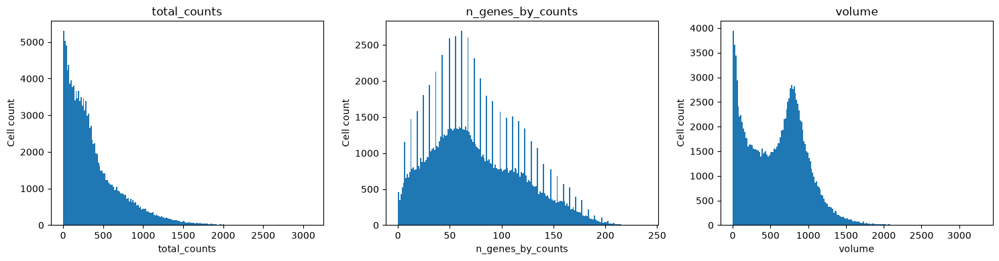

In [23]:
import matplotlib.pyplot as plt

cols = [
    "total_counts",
    "n_genes_by_counts",
    "volume"]

print(adata.obs[cols].describe(percentiles=[
    0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99
]))


fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, col in zip(axes, cols):
    ax.hist(
        adata.obs[col],
        bins=200
    )
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Cell count")

plt.tight_layout()
plt.show()

Removed cells: 3159
Remaining cells: 136456


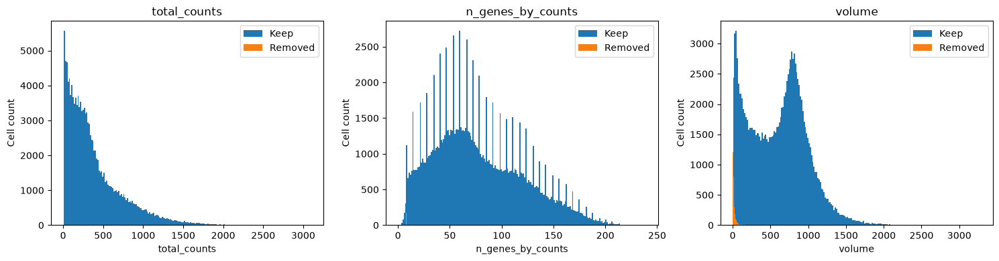

In [25]:
import matplotlib.pyplot as plt

cols = [
    "total_counts",
    "n_genes_by_counts",
    "volume"
]

remove_mask = adata.obs["total_counts"] < 10

print("Removed cells:", remove_mask.sum())
print("Remaining cells:", (~remove_mask).sum())


fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, col in zip(axes, cols):

    ax.hist(
        adata.obs.loc[~remove_mask, col],
        bins=200,
        label="Keep"
    )

    ax.hist(
        adata.obs.loc[remove_mask, col],
        bins=200,
        label="Removed"
    )

    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Cell count")
    ax.legend()

plt.tight_layout()
plt.show()

In [26]:
adata = adata[~remove_mask].copy()

# Clustering (Merscope)

In [27]:
adata.layers['RNA'] = adata.X.copy()

In [28]:
sc.pp.normalize_total(
    adata,
    target_sum=10000)

In [29]:
sc.pp.log1p(adata)

In [30]:
sc.pp.scale(
    adata,
    max_value=10)

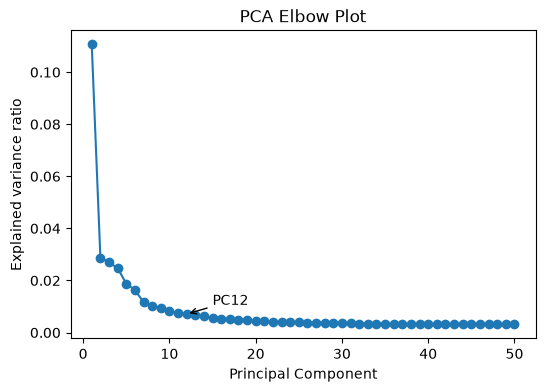

In [31]:
sc.tl.pca(
    adata,
    n_comps=50)

var_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6,4))

plt.plot(
    range(1, len(var_ratio)+1),
    var_ratio,
    marker="o"
)

plt.annotate(
    "PC12",
    xy=(12, var_ratio[11]),
    xytext=(15, var_ratio[11]*1.5),
    arrowprops=dict(
        arrowstyle="->"
    )
)

plt.xlabel("Principal Component")
plt.ylabel("Explained variance ratio")
plt.title("PCA Elbow Plot")

plt.show()

In [32]:
sc.tl.pca( adata, n_comps=12)

In [33]:
sc.pp.neighbors(
    adata,
    n_neighbors=15,
    n_pcs=12)

2026-07-22 06:39:39.613708: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1784669979.625857 4056161 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1784669979.630007 4056161 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1784669979.640263 4056161 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1784669979.640277 4056161 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1784669979.640279 4056161 computation_placer.cc:177] computation placer alr

In [50]:
adata.write_h5ad(
    "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/merged_after_lognorm.h5ad",compression="gzip")

In [39]:
###################################################################
###################### UMAP BENCHMARK #############################
###################################################################

In [1]:
import scanpy as sc

adata = sc.read_h5ad('/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/merged_after_lognorm.h5ad')

In [4]:
import scvi 
from scvi.model import SCVI

scvi.model.SCVI.setup_anndata(adata, layer="RNA", batch_key="sample_id")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

ModuleNotFoundError: No module named 'yaml'

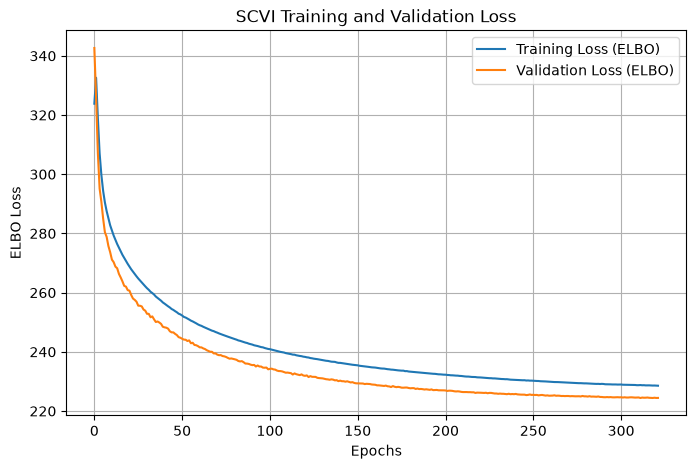

In [40]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

Text(0.5, 1.0, 'scVI')

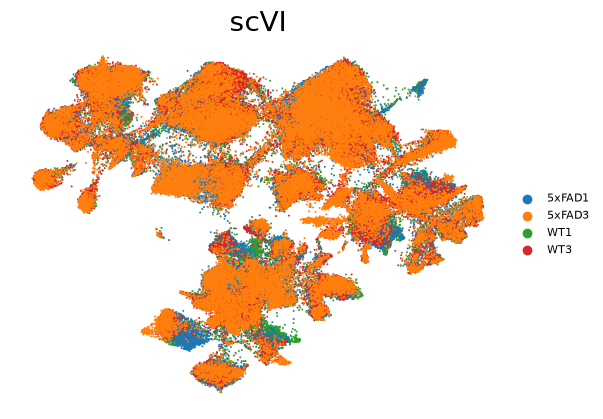

In [42]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=['sample_id'],
    frameon=False,
    size= 8,
    legend_fontsize=8,
    legend_fontoutline=3,
    title="Sample",
    show=False)

plt.title("scVI", fontsize=20)

In [2]:
import scanpy.external as sce

adata_bbknn = adata.copy()

sc.pp.pca(
    adata_bbknn,
    n_comps=12)

sce.pp.bbknn(
    adata_bbknn,
    batch_key="sample_id",
    neighbors_within_batch=5,
    n_pcs=12)

sc.tl.umap(
    adata_bbknn)

sc.tl.leiden(
    adata_bbknn,
    resolution=1)

/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-07-22 16:45:04.404654: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1784706304.419256  313141 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1784706304.424162  313141 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1784706304.435973  313141 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same

/tmp/ipykernel_313141/4002197801.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


In [3]:
import harmonypy as hm

adata_harmony = adata.copy()

sc.pp.pca(
    adata_harmony,
    n_comps=12)


ho = hm.run_harmony(
    adata_harmony.obsm["X_pca"],
    adata_harmony.obs, "sample_id")

adata_harmony.obsm["X_harmony"] = ho.Z_corr

sc.pp.neighbors(
    adata_harmony,
    use_rep="X_harmony",
    n_neighbors=15)

sc.tl.umap(adata_harmony)

sc.tl.leiden(
    adata_harmony,
    resolution=1)

2026-07-22 16:51:57,341 - harmonypy - INFO - Running Harmony
2026-07-22 16:51:57,344 - harmonypy - INFO -   Parameters:
2026-07-22 16:51:57,345 - harmonypy - INFO -     max_iter_harmony: 10
2026-07-22 16:51:57,346 - harmonypy - INFO -     max_iter_kmeans: 4
2026-07-22 16:51:57,346 - harmonypy - INFO -     epsilon_cluster: 0.001
2026-07-22 16:51:57,347 - harmonypy - INFO -     epsilon_harmony: 0.01
2026-07-22 16:51:57,347 - harmonypy - INFO -     nclust: 100
2026-07-22 16:51:57,348 - harmonypy - INFO -     block_size: 0.05
2026-07-22 16:51:57,348 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
2026-07-22 16:51:57,349 - harmonypy - INFO -     theta: [2. 2. 2. 2.]
2026-07-22 16:51:57,350 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-07-22 16:51:57,350 - harmonypy - INFO -     verbose: True
2026-07-22 16:51:57,351 - harmonypy - INFO -     random_state: 0
2026-07-22 16:51:57,351 - harmonypy - INFO -   Data: 12 PCs × 136456 cells
2026-07-22 16:51:57,352 - harmonypy - INFO 

In [12]:
from scib_metrics.benchmark import Benchmarker

adata.obsm["X_scVI"] = adata.obsm["X_scVI"]
adata_harmony.obsm["X_harmony"] = adata_harmony.obsm["X_harmony"]
adata_bbknn.obsm["X_bbknn"] = adata_bbknn.obsm["X_pca"]

adata_bench = adata.copy()
adata_bench.obsm["X_scVI"] = adata.obsm["X_scVI"]
adata_bench.obsm["X_harmony"] = adata_harmony.obsm["X_harmony"]
adata_bench.obsm["X_bbknn"] = adata_bbknn.obsm["X_pca"]

sc.pp.neighbors(
    adata_bench,
    use_rep="X_scVI",
    key_added="neighbors_scVI")

sc.pp.neighbors(
    adata_bench,
    use_rep="X_harmony",
    key_added="neighbors_harmony")

sc.pp.neighbors(
    adata_bench,
    use_rep="X_bbknn",
    key_added="neighbors_bbknn")

In [17]:
from scib_metrics.benchmark import Benchmarker

sc.pp.neighbors(
    adata_bench,
    use_rep="X_scVI")

sc.tl.leiden(
    adata_bench,
    key_added="leiden_scvi")

adata_bench.obs["leiden"] = adata_bench.obs["leiden_scvi"]

bm = Benchmarker(
    adata_bench,
    batch_key="sample_id",
    label_key="leiden",
    embedding_obsm_keys=[
        "X_scVI",
        "X_harmony",
        "X_bbknn"])

In [19]:
bm.benchmark()

/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
rics:   0%|          | 0/10 [00:00<?, ?it/s]

Embeddings:  33%|███▎      | 1/3 [06:28<12:56, 388.46s/it]tch correction: pcr_comparison]
                                                                                      
Embeddings:  67%|██████▋   | 2/3 [11:27<05:35, 335.62s/it]tch correction: pcr_comparison]
                                                                                      
rics:  80%|████████  | 8/10 [04:14<01:02, 31.44s/it, Batch correction: graph_connectivity]
/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scib_metrics/metrics/_pcr

In [20]:
results = bm.get_results()
results

,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,BRAS,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
X_scVI,0.779665,0.779394,0.581098,0.573751,0.999917,0.902231,0.535799,0.333416,0.958356,0.743525,0.694665,0.742765,0.723525
X_harmony,0.63665,0.603815,0.334474,0.52198,0.986039,0.915848,0.644821,0.574327,0.85965,0.883808,0.775691,0.616591,0.680231
X_bbknn,0.635468,0.580681,0.308551,0.518837,0.986819,0.781678,0.326442,0.201764,0.873073,0,0.436591,0.606071,0.538279
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


In [36]:
import pandas as pd

plot_df = results.loc[
    ["X_scVI", "X_harmony", "X_bbknn"],
    [
        "Isolated labels",
        "Silhouette label",
        "Graph connectivity",
        "Bio conservation",
        "Total"
    ]
].astype(float)


def gradient_bar(val):
    pct = val * 100
    alpha = 0.2 + 0.8 * val
    
    return (
        f"background: linear-gradient("
        f"90deg,"
        f"rgba(255,0,0,{alpha}) 0%,"
        f"rgba(255,0,0,{alpha}) {pct}%,"
        f"white {pct}%,"
        f"white 100%);"
        f"border:1px solid black;"
    )


plot_df.style.map(
    gradient_bar
)

,Isolated labels,Silhouette label,Graph connectivity,Bio conservation,Total
Embedding,,,,,
X_scVI,0.779665,0.573751,0.958356,0.742765,0.723525
X_harmony,0.636650,0.521980,0.859650,0.616591,0.680231
X_bbknn,0.635468,0.518837,0.873073,0.606071,0.538279


In [3]:
###################################################################
###################### Label transfer #############################
###################################################################

In [65]:
import scanpy as sc

adata = sc.read_h5ad('/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/merged_after_lognorm.h5ad')

In [72]:
import scanpy as sc
import pandas as pd
import os

base="/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer"

adata_ref=sc.read_h5ad(os.path.join(base,"WMB-10Xv3-HPF-raw.h5ad"))

cell_metadata=pd.read_csv(os.path.join(base,"cell_metadata.csv"),index_col=0)
cluster_metadata=pd.read_csv(os.path.join(base,"cell_metadata_with_cluster_annotation.csv"),index_col=0)
gene_metadata=pd.read_csv(os.path.join(base,"gene.csv"),index_col=0)

cell_metadata=cell_metadata.reindex(adata_ref.obs_names)
cluster_metadata=cluster_metadata.reindex(adata_ref.obs_names)

new_obs=pd.concat([cell_metadata,cluster_metadata],axis=1)
new_obs=new_obs.loc[:,~new_obs.columns.duplicated()]
new_obs=new_obs.drop(columns=adata_ref.obs.columns.intersection(new_obs.columns))

adata_ref.obs=pd.concat([adata_ref.obs,new_obs],axis=1)

gene_metadata=gene_metadata.reindex(adata_ref.var_names)
gene_metadata=gene_metadata.loc[:,~gene_metadata.columns.duplicated()]
gene_metadata=gene_metadata.drop(columns=adata_ref.var.columns.intersection(gene_metadata.columns))

adata_ref.var=pd.concat([adata_ref.var,gene_metadata],axis=1)

adata_ref.var["ensembl_id"]=adata_ref.var.index
adata_ref.var_names=adata_ref.var["gene_symbol"].astype(str)
adata_ref.var_names.name=None

keep_gene=~adata_ref.var_names.duplicated()
adata_ref=adata_ref[:,keep_gene].copy()

adata_ref.obs=adata_ref.obs.loc[:,~adata_ref.obs.columns.duplicated()]
adata_ref.var=adata_ref.var.loc[:,~adata_ref.var.columns.duplicated()]

adata_ref.var_names_make_unique()

/tmp/ipykernel_55859/2586604715.py:10: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  cluster_metadata=pd.read_csv(os.path.join(base,"cell_metadata_with_cluster_annotation.csv"),index_col=0)


In [75]:
adata_ref.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer/HPF_sort.h5ad")

In [85]:
import scanpy as sc

adata_ref = sc.read_h5ad('/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer/HPF_sort.h5ad')

In [86]:
adata.X = adata.layers['RNA'].copy()

In [87]:
import scanpy as sc
import scvi

common_genes = adata.var_names.intersection(adata_ref.var_names)

adata = adata[:, common_genes].copy()
adata_ref = adata_ref[:, common_genes].copy()

adata.obs["batch"] = adata.obs["sample_id"].astype(str)
adata_ref.obs["batch"] = adata_ref.obs["library_label"].astype(str)

adata.obs["dataset"] = "MERSCOPE"
adata_ref.obs["dataset"] = "Allen"

adata_all = adata_ref.concatenate(
    adata,
    batch_key="source")

scvi.model.SCVI.setup_anndata(
    adata_all,
    batch_key="batch")

model = scvi.model.SCVI(
    adata_all,
    n_latent=30)

model.train()

adata_all.obsm["X_scVI"] = model.get_latent_representation()

/tmp/ipykernel_55859/562983363.py:15: FutureWarning: The method concatenate is deprecated and will be removed in the future. Use anndata.concat instead of AnnData.concatenate. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all = adata_ref.concatenate(
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/pytho

Epoch 25/25: 100%|██████████| 25/25 [09:39<00:00, 22.73s/it, v_num=1, train_loss=213]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 25/25: 100%|██████████| 25/25 [09:39<00:00, 23.18s/it, v_num=1, train_loss=213]


In [88]:
ref_idx = adata_all.obs["dataset"]=="Allen"
query_idx = adata_all.obs["dataset"]=="MERSCOPE"

adata_ref_scvi = adata_all[ref_idx].copy()
adata_query_scvi = adata_all[query_idx].copy()

X_ref = adata_ref_scvi.obsm["X_scVI"]
X_query = adata_query_scvi.obsm["X_scVI"]

In [90]:
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd

labels = [
    "class",
    "subclass",
    "supertype",
    "cluster"
]

result = pd.DataFrame(index=adata_query_scvi.obs_names.str.replace("-1$", "", regex=True))

for label in labels:
    clf = KNeighborsClassifier(
        n_neighbors=20,
        weights="distance"
    )

    clf.fit(
        X_ref,
        adata_ref_scvi.obs[label]
    )

    prob = clf.predict_proba(X_query)

    result[label+"_pred"] = clf.classes_[prob.argmax(axis=1)]
    result[label+"_score"] = prob.max(axis=1)

adata.obs = adata.obs.drop(
    columns=result.columns,
    errors="ignore"
).join(result)

In [97]:
for col in [
    "class_pred",
    "subclass_pred",
    "supertype_pred",
    "cluster_pred"]:
    
    print("\n", col)
    print(adata.obs[col].value_counts())


 class_pred
class_pred
29 Oligo             33089
28 Astro-Epen        28597
01 IT-ET Glut        25139
31 Vascular          17814
32 Immune            11293
02 NP-CT-L6b Glut     6704
05 MGE GABA           5028
03 MOB-DG-IMN         4854
04 CGE GABA           3288
06 CNU GABA            341
12 MOB-CR Glut         270
20 MB GABA              36
14 CNU-HYa GABA          3
Name: count, dtype: int64

 subclass_pred
subclass_pred
295 Oligo NN                   28752
287 Astro-TE NN                27197
301 Endo NN                    12398
302 Microglia NN               10326
019 L2/3 IT PPP Glut            6381
                               ...  
289 Astroependymal NN              3
250 SNc-VTA-RAmb Foxa1 Dopa        1
025 L6b EPd Glut                   1
304 Monocytes NN                   1
013 COAp Grxcr2 Glut               1
Name: count, Length: 62, dtype: int64

 supertype_pred
supertype_pred
1027 MOL NN                        28672
1007 Astro-TE NN_3                 26267
1037 Endo 

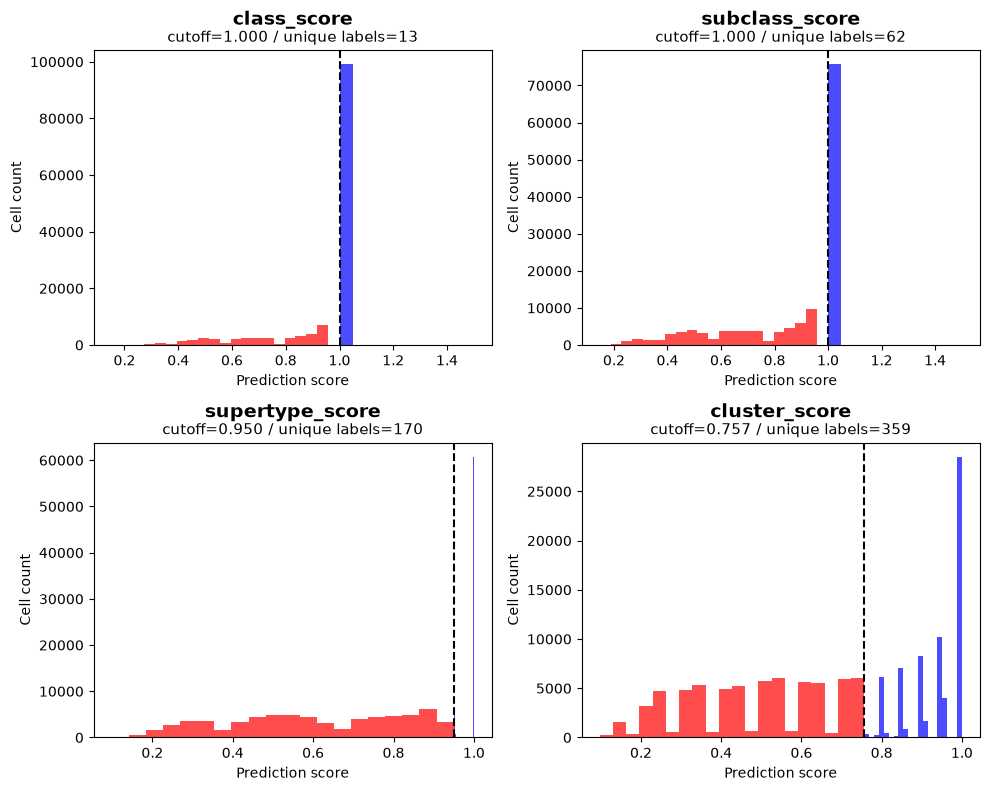

{'class_score': np.float64(1.0),
 'subclass_score': np.float64(1.0),
 'supertype_score': np.float64(0.9497134524843618),
 'cluster_score': np.float64(0.7566403975094327)}

In [124]:
import matplotlib.pyplot as plt

scores = [
    "class_score",
    "subclass_score",
    "supertype_score",
    "cluster_score"
]

cutoffs = {}

fig, axes = plt.subplots(
    2, 2,
    figsize=(10, 8)
)

axes = axes.flatten()

for ax, score in zip(axes, scores):

    x = adata.obs[score].dropna()

    cutoff = x.quantile(0.50)
    cutoffs[score] = cutoff

    pred_col = score.replace("_score", "_pred")
    unique_count = adata.obs[pred_col].nunique()

    ax.hist(
        x[x < cutoff],
        bins=20,
        color="red",
        alpha=0.7
    )

    ax.hist(
        x[x >= cutoff],
        bins=20,
        color="blue",
        alpha=0.7
    )

    ax.axvline(
        cutoff,
        linestyle="--",
        color="black"
    )

    ax.set_title(
    f"cutoff={cutoff:.3f} / unique labels={unique_count}",
    fontsize=11
)

    ax.text(
    0.5,
    1.07,
    score,
    transform=ax.transAxes,
    ha="center",
    va="bottom",
    fontsize=14,
    fontweight="bold"
)

    ax.set_xlabel("Prediction score")
    ax.set_ylabel("Cell count")

plt.tight_layout()
plt.show()

cutoffs

In [127]:
adata.obs['final_label_transfer'] = adata.obs['class_pred'].where(adata.obs['class_score'] == 1, 'unpredicted')

<Axes: title={'center': 'final_label_transfer'}, xlabel='UMAP1', ylabel='UMAP2'>

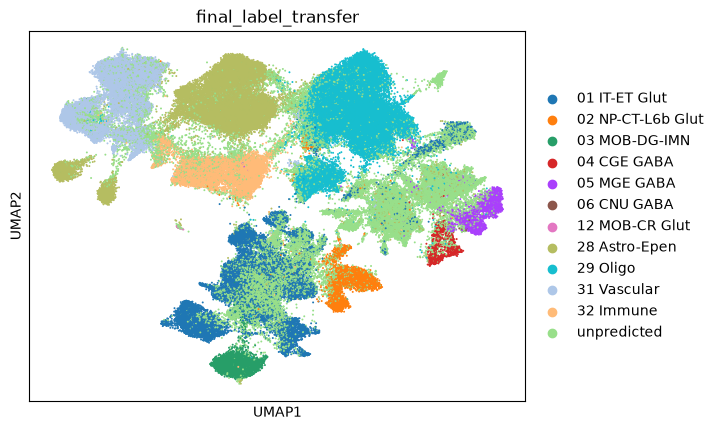

In [133]:
sc.pl.umap(
    adata,
    color=['final_label_transfer'],
    size= 8,
    show=False)

In [12]:
adata.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer.h5ad")

In [135]:
###################################################################
#################### Manual annotation ############################
###################################################################

In [16]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer.h5ad")

In [17]:
for res in [0.10, 0.25, 0.50]:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

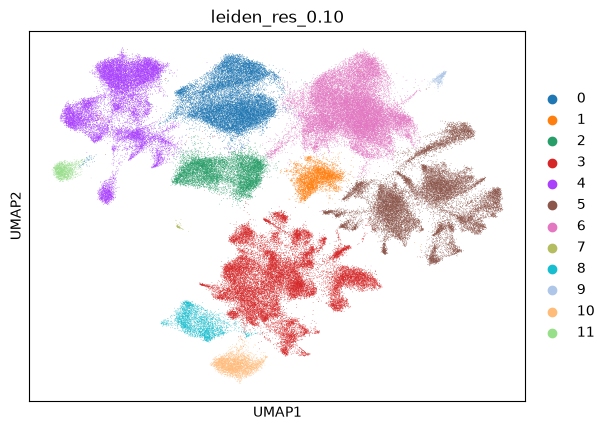

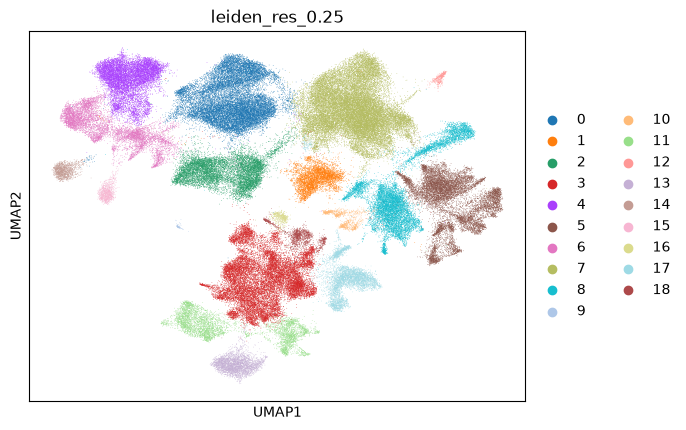

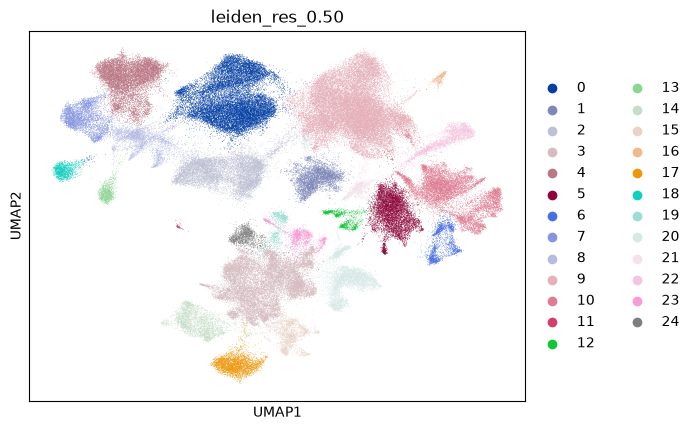

In [18]:
sc.pl.umap(adata, color=["leiden_res_0.10"])
sc.pl.umap(adata, color=["leiden_res_0.25"])
sc.pl.umap(adata, color=["leiden_res_0.50"])

In [21]:
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)

Cluster 0: ['Bcan', 'Apoe', 'Clu', 'Grin2c', 'Aqp4', 'Aldh1l1', 'Id4', 'Ntrk2', 'C4b', 'Rorb', 'Cspg5', 'Pdgfrb', 'Pax6', 'Camk2g', 'Mmp14', 'Gfap', 'Itga7', 'Vcam1', 'Celsr1', 'Wfs1']
Cluster 1: ['Olig1', 'Pdgfra', 'Cspg4', 'Sox10', 'Bcan', 'Cspg5', 'Sulf2', 'Sema5b', 'Sox8', 'Grin3a', 'Elfn1', 'Nnat', 'Apoe', 'Acan', 'Kcnd2', 'S100b', 'Trib2', 'Ntrk2', 'Src', 'Neto1']
Cluster 2: ['C1qa', 'Csf1r', 'Trem2', 'Ctss', 'Inpp5d', 'Abi3', 'Tmem119', 'Plcg2', 'Prkcd', 'Siglech', 'Spi1', 'P2ry12', 'Apoe', 'Icam1', 'Mrc2', 'Ly9', 'Cbln4', 'Casp8', 'Itgax', 'Cst7']
Cluster 3: ['Slc17a7', 'Slc30a3', 'Nptxr', 'Grin1', 'Camk2a', 'Ptk2b', 'Syp', 'Nptx1', 'Cx3cl1', 'Grin2a', 'Cckbr', 'Cck', 'Chrm4', 'Grin2b', 'Syngap1', 'Syn1', 'Gria2', 'Nrg3', 'Gpr158', 'Gria3']
Cluster 4: ['Cldn5', 'Flt1', 'Fn1', 'Nos3', 'Tek', 'Apoe', 'App', 'Ctnnb1', 'Ndnf', 'Cd2ap', 'Zbtb20', 'Fmo1', 'Erbb2', 'Casp8', 'Kcnq1', 'Icam1', 'Trib2', 'Clu', 'Abi3', 'Inpp5d']
Cluster 5: ['Slc32a1', 'Gad1', 'Gad2', 'Kcnc1', 'Syp', 'Grin

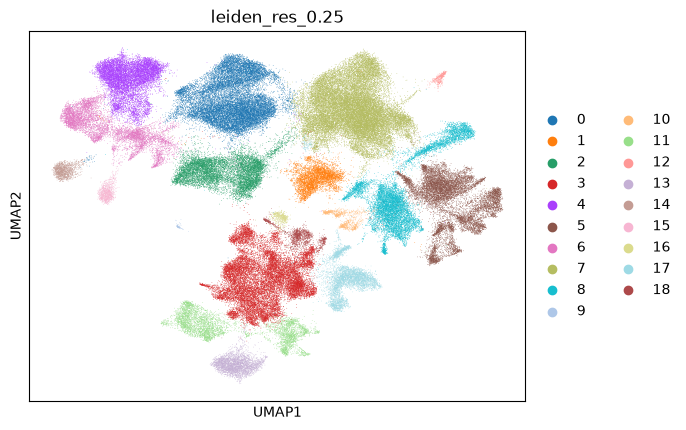

In [27]:
import scanpy as sc
adata.obs['leiden_res_0.25'] = adata.obs['leiden_res_0.25'].astype('category')
sc.tl.rank_genes_groups(adata, groupby='leiden_res_0.25', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
    
sc.pl.umap(
    adata,
    color='leiden_res_0.25')

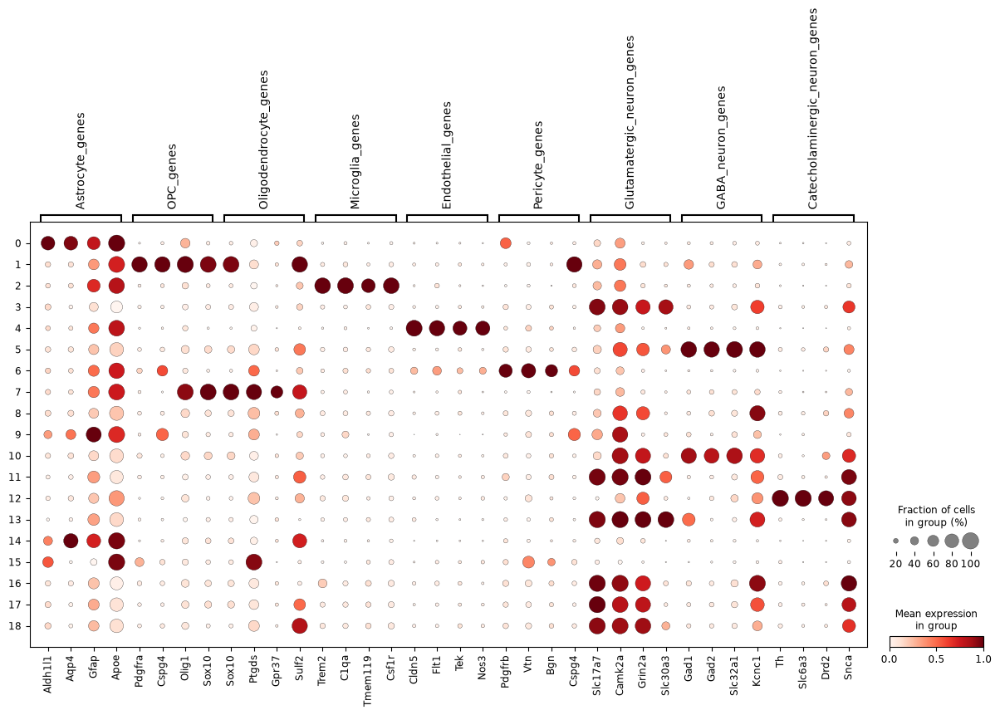

In [33]:
import scanpy as sc

group_markers = {
    "Astrocyte_genes": ['Aldh1l1','Aqp4','Gfap','Apoe'],
    "OPC_genes": ['Pdgfra','Cspg4','Olig1','Sox10'],
    "Oligodendrocyte_genes": ['Sox10','Ptgds','Gpr37','Sulf2'],
    "Microglia_genes": ['Trem2','C1qa','Tmem119','Csf1r'],
    "Endothelial_genes": ['Cldn5','Flt1','Tek','Nos3'],
    "Pericyte_genes": ['Pdgfrb','Vtn','Bgn','Cspg4'],
    "Glutamatergic_neuron_genes": ['Slc17a7','Camk2a','Grin2a','Slc30a3'],
    "GABA_neuron_genes": ['Gad1','Gad2','Slc32a1','Kcnc1'],
    "Catecholaminergic_neuron_genes": ['Th','Slc6a3','Drd2','Snca']}

existing_genes = {cat:[gene for gene in genes if gene in adata.var_names] for cat, genes in group_markers.items()}
existing_genes = {cat:genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, var_names=existing_genes, groupby="leiden_res_0.25", standard_scale="var")

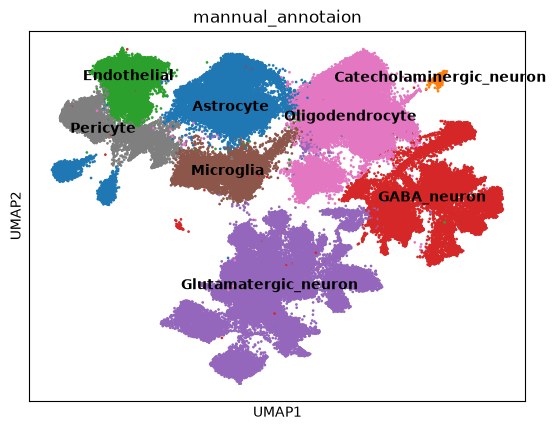

In [45]:
cluster_to_group = {
    0: "Astrocyte",
    1: "Oligodendrocyte",
    2: "Microglia",
    3: "Glutamatergic_neuron",
    4: "Endothelial",
    5: "GABA_neuron",
    6: "Pericyte",
    7: "Oligodendrocyte",
    8: "GABA_neuron",
    9: "GABA_neuron",
    10: "Glutamatergic_neuron",
    11: "Glutamatergic_neuron",
    12: "Catecholaminergic_neuron",
    13: "Glutamatergic_neuron",
    14: "Astrocyte",
    15: "Astrocyte",
    16: "Glutamatergic_neuron",
    17: "Glutamatergic_neuron",
    18: "Glutamatergic_neuron"}


adata.obs["mannual_annotaion"] = adata.obs["leiden_res_0.25"].astype(int).map(cluster_to_group)
sc.pl.umap(
    adata,
    color='mannual_annotaion',
    legend_loc='on data'
    , s = 15
)

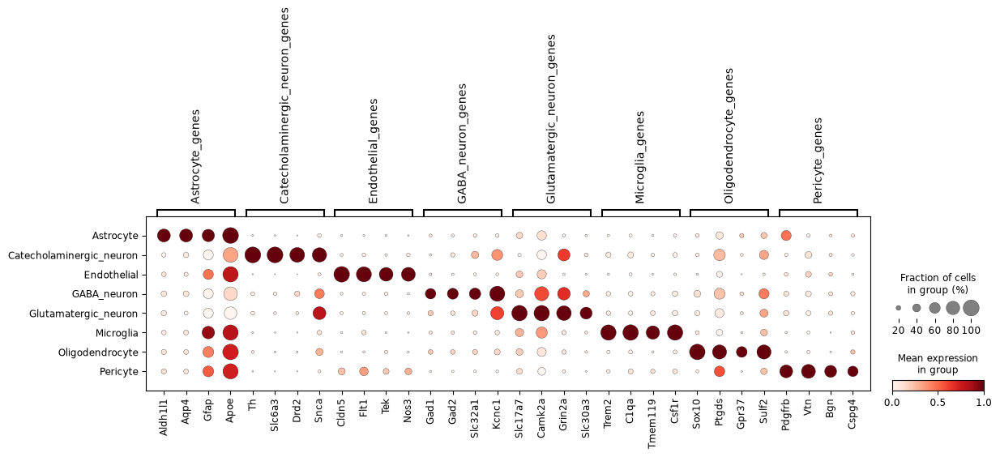

In [48]:
import scanpy as sc

group_markers = {
    "Astrocyte_genes": ['Aldh1l1','Aqp4','Gfap','Apoe'],
    "Catecholaminergic_neuron_genes": ['Th','Slc6a3','Drd2','Snca'],
    "Endothelial_genes": ['Cldn5','Flt1','Tek','Nos3'],
    "GABA_neuron_genes": ['Gad1','Gad2','Slc32a1','Kcnc1'],
    "Glutamatergic_neuron_genes": ['Slc17a7','Camk2a','Grin2a','Slc30a3'],
    "Microglia_genes": ['Trem2','C1qa','Tmem119','Csf1r'],
    "Oligodendrocyte_genes": ['Sox10','Ptgds','Gpr37','Sulf2'],
    "Pericyte_genes": ['Pdgfrb','Vtn','Bgn','Cspg4']  
}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, var_names=existing_genes, groupby="mannual_annotaion", standard_scale="var")

In [49]:
adata.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad")

In [1]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad")

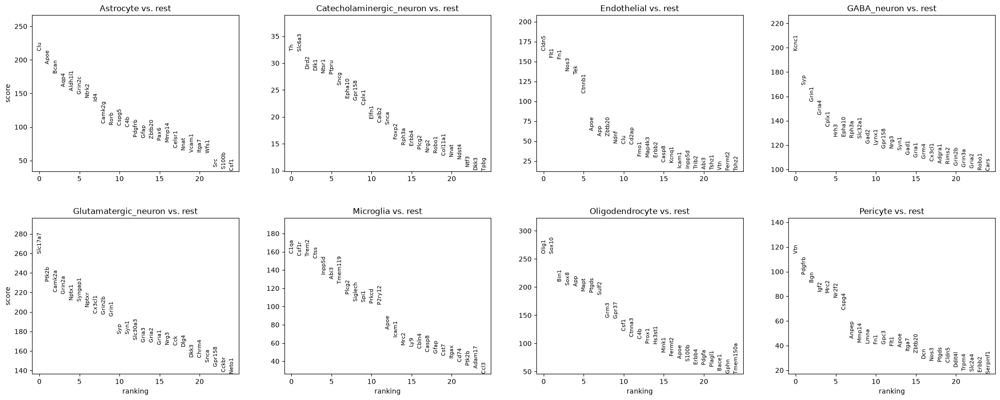

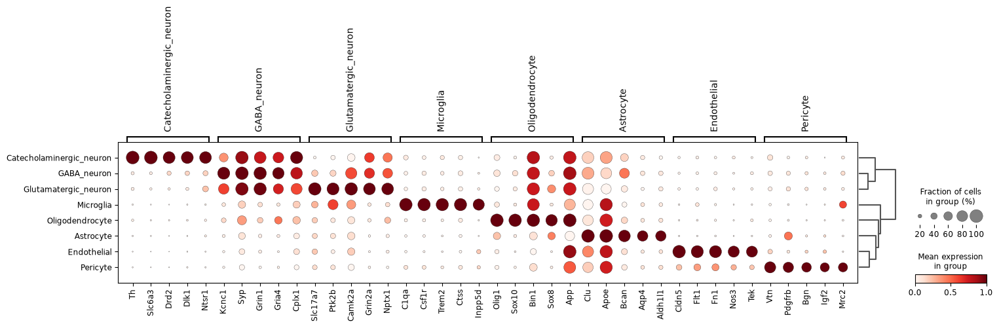

In [18]:
sc.tl.rank_genes_groups(adata, 'mannual_annotaion', method="wilcoxon",use_raw =False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='mannual_annotaion')
sc.pl.rank_genes_groups_dotplot(adata, groupby="mannual_annotaion", standard_scale="var",  n_genes=5, use_raw=False)

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names 
result_df = pd.DataFrame({
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]})

up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())
df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())
sc.tl.dendrogram(adata, groupby='mannual_annotaion')

In [19]:
import pandas as pd
import scanpy as sc

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]})
up_dict = {}
down_dict = {}
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로
df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

In [20]:
import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from qed.data import get_enrichment_dataframes, merge_df


class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}


dblist = ['CellMarker_2024','CellMarker_Augmented_2021','PanglaoDB_Augmented_2021']

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')

geneset_list = [
    GeneSet(
        genes=alist[col].dropna().tolist(),
        name=col,
        annot={"Leiden": col})
    for col in alist.columns]

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="mannual_annotaion",
    handle_error=True,
    max_iter=1)

df = merge_df(aalist)

df['Term'] = (
    df['Term']
    .str.split(r'\(GO:').str[0]
    .str.split('R-H').str[0]
    .str.split('WP').str[0]
    .str.strip())

Processing genesets:  12%|█▎        | 1/8 [00:00<00:04,  1.51it/s]

Error processing Astrocyte for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Endothelial for CellMarker_2024: Error analyzing gene list
Error processing Catecholaminergic_neuron for CellMarker_Augmented_2021: Error analyzing gene list
Error processing GABA_neuron for CellMarker_2024: Error analyzing gene list
Error processing Endothelial for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Glutamatergic_neuron for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Glutamatergic_neuron for CellMarker_Augmented_2021: Error analyzing gene list
Error processing GABA_neuron for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Endothelial for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Pericyte for CellMarker_2024: Error analyzing gene list
Error processing GABA_neuron for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Microglia for PanglaoDB_Augmented_2021: Erro

Processing genesets: 24it [00:01, 12.54it/s]                      


Trying to re-request...
Astrocyte with CellMarker_Augmented_2021 completed!
Catecholaminergic_neuron with CellMarker_Augmented_2021 completed!
Endothelial with CellMarker_2024 completed!
Endothelial with CellMarker_Augmented_2021 completed!
Endothelial with PanglaoDB_Augmented_2021 completed!
GABA_neuron with CellMarker_2024 completed!
GABA_neuron with CellMarker_Augmented_2021 completed!
GABA_neuron with PanglaoDB_Augmented_2021 completed!
Glutamatergic_neuron with CellMarker_2024 completed!
Glutamatergic_neuron with CellMarker_Augmented_2021 completed!
Glutamatergic_neuron with PanglaoDB_Augmented_2021 completed!
Microglia with CellMarker_2024 completed!
Microglia with PanglaoDB_Augmented_2021 completed!
Oligodendrocyte with CellMarker_2024 completed!
Oligodendrocyte with CellMarker_Augmented_2021 completed!
Oligodendrocyte with PanglaoDB_Augmented_2021 completed!
Pericyte with CellMarker_2024 completed!
Pericyte with CellMarker_Augmented_2021 completed!
Pericyte with PanglaoDB_Augme

In [33]:
from typing import Dict, Tuple

def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):
    
    df = df.copy()
    df[order_by] = pd.to_numeric(df[order_by], errors="coerce")
    df = df.dropna(subset=[order_by])

    df["Term_lower"] = df["Term"].str.lower()

    selected = (
        df.sort_values(order_by)
        .groupby(group_by)
        .head(n))

    terms = selected["Term_lower"].unique()

    plot_df = (
        df[df["Term_lower"].isin(terms)]
        .groupby(["Term_lower", group_by])[order_by]
        .min()
        .reset_index()
        .pivot(index="Term_lower", columns=group_by, values=order_by)
        .fillna(1))

    plot_df = -np.log10(plot_df)

    plot_df.index = plot_df.index.str.capitalize()

    rows = []
    for group in column_order if column_order else df[group_by].unique():
        group_terms = selected[selected[group_by]==group]["Term_lower"]
        rows.extend(
            [x.capitalize() for x in group_terms if x.capitalize() in plot_df.index])

    rows = list(dict.fromkeys(rows))
    plot_df = plot_df.loc[rows]

    if column_order:
        cols = [x for x in column_order if x in plot_df.columns]
        plot_df = plot_df[cols]

    if save_to_file:
        plot_df.to_csv(save_to_file, encoding="utf-8-sig")

    fig, ax = plt.subplots(figsize=figsize)

    sns.heatmap(
        plot_df,
        cmap=cmap,
        linewidths=0.1,
        square=True,
        annot=np.where(10**(-plot_df)<=0.05,"*",""),
        fmt="",
        ax=ax)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)

    return fig, ax

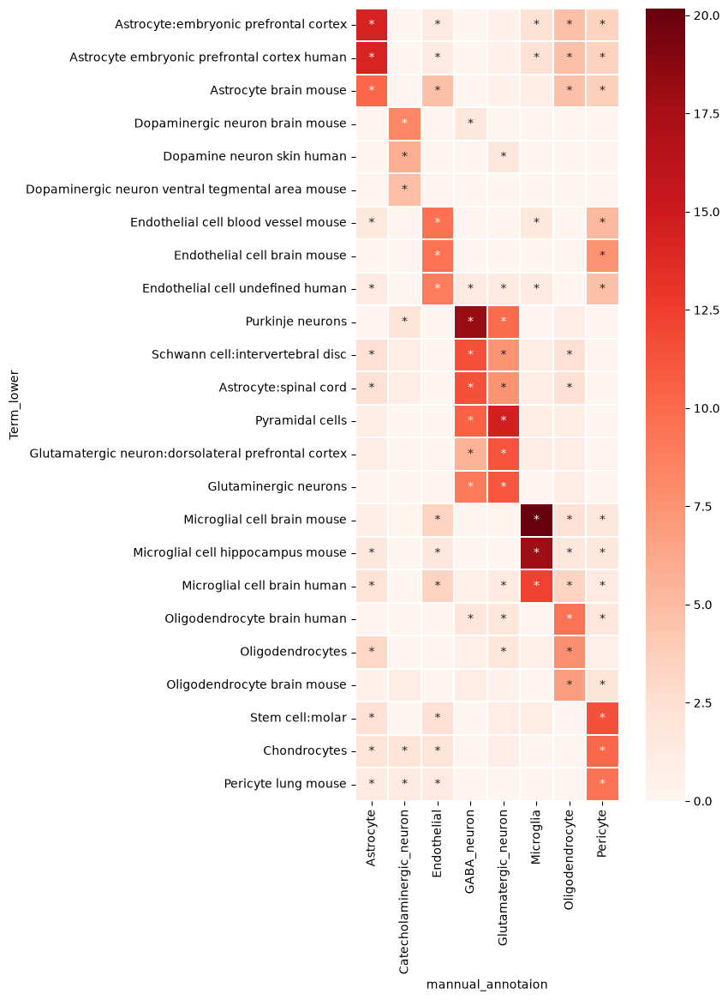

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df,
    n=3,
    group_by='mannual_annotaion',
    order_by="P-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=10,
    ylabel_fontsize=10,
    figsize=(8, 12),
    vmin=1, vmax=6,
    cbar_kws={'shrink': 1, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

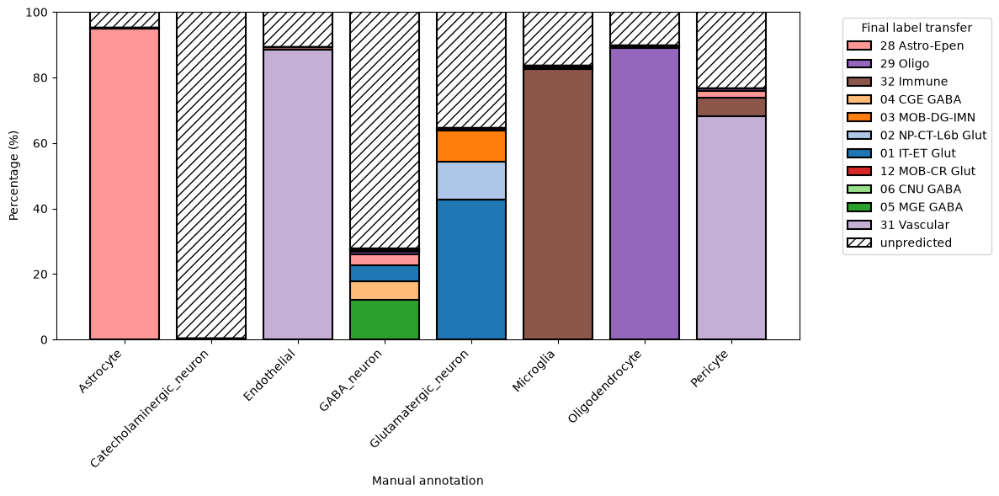

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

ct = pd.crosstab(
    adata.obs['mannual_annotaion'],
    adata.obs['final_label_transfer'],
    normalize='index'
) * 100

labels = ct.columns.tolist()

colors = dict(zip(labels, plt.cm.tab20.colors))

fig, ax = plt.subplots(figsize=(12,6))

legend_labels = []

for i, idx in enumerate(ct.index):

    row = ct.loc[idx].sort_values(ascending=False)

    if 'unpredicted' in row.index:
        row = pd.concat([row.drop('unpredicted'), row[['unpredicted']]])

    bottom = 0

    for label, value in row.items():

        if label == 'unpredicted':
            ax.bar(
                i,
                value,
                bottom=bottom,
                color='none',
                edgecolor='black',
                hatch='///',
                linewidth=1.5,
                label=label if label not in legend_labels else None
            )

        else:
            ax.bar(
                i,
                value,
                bottom=bottom,
                color=colors[label],
                edgecolor='black',
                linewidth=1.5,
                label=label if label not in legend_labels else None
            )

        if label not in legend_labels:
            legend_labels.append(label)

        bottom += value


ax.set_xticks(range(len(ct.index)))
ax.set_xticklabels(ct.index, rotation=45, ha='right')

ax.set_ylabel("Percentage (%)")
ax.set_xlabel("Manual annotation")

ax.set_ylim(0,100)

ax.legend(
    title="Final label transfer",
    bbox_to_anchor=(1.05,1),
    loc="upper left"
)

plt.tight_layout()
plt.show()

# CCF mapping (Merscope)

In [38]:
# 1) Setup: imports and paths
import os
import glob
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# Optional deps for atlas files
try:
    import nrrd
except ImportError:
    raise ImportError("Please install pynrrd in this kernel: pip install pynrrd")

DATA_DIR = "/home/Data_Drive_8TB_2/kykim/potrai/DAPI_downsampling"
ADATA_PATH = "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad"
ATLAS_ANNOT_PATH = os.path.join(DATA_DIR, "annotation_25.nrrd")
ATLAS_TEMPLATE_PATH = os.path.join(DATA_DIR, "average_template_25.nrrd")
STRUCTURE_TREE_PATH = os.path.join(DATA_DIR, "structure_tree_safe_2017.csv")

print("DATA_DIR:", DATA_DIR)
print("ADATA_PATH exists:", os.path.exists(ADATA_PATH))
print("ATLAS_ANNOT_PATH exists:", os.path.exists(ATLAS_ANNOT_PATH))
print("ATLAS_TEMPLATE_PATH exists:", os.path.exists(ATLAS_TEMPLATE_PATH))
print("STRUCTURE_TREE_PATH exists:", os.path.exists(STRUCTURE_TREE_PATH))

DATA_DIR: /home/Data_Drive_8TB_2/kykim/potrai/DAPI_downsampling
ADATA_PATH exists: True
ATLAS_ANNOT_PATH exists: True
ATLAS_TEMPLATE_PATH exists: True
STRUCTURE_TREE_PATH exists: True


In [39]:
# 2) Load adata and atlas resources
adata = sc.read_h5ad(ADATA_PATH)
print(adata)

annotation_vol, annotation_hdr = nrrd.read(ATLAS_ANNOT_PATH)
template_vol, template_hdr = nrrd.read(ATLAS_TEMPLATE_PATH)
print("annotation shape:", annotation_vol.shape, "dtype:", annotation_vol.dtype)
print("template shape:", template_vol.shape, "dtype:", template_vol.dtype)

st = pd.read_csv(STRUCTURE_TREE_PATH)
print("structure_tree columns:", st.columns.tolist())
print("structure_tree rows:", st.shape[0])

# Build id -> acronym/name mapper
id_col = "id" if "id" in st.columns else st.columns[0]
acr_col = "acronym" if "acronym" in st.columns else None
name_col = "name" if "name" in st.columns else None

id_to_acr = {}
id_to_name = {}
for _, r in st.iterrows():
    rid = int(r[id_col])
    id_to_acr[rid] = str(r[acr_col]) if acr_col is not None else str(rid)
    id_to_name[rid] = str(r[name_col]) if name_col is not None else str(rid)

AnnData object with n_obs × n_vars = 136456 × 300
    obs: 'fov', 'center_x', 'center_y', 'x_min', 'x_max', 'y_min', 'y_max', 'volume', 'sample_id', 'genotype', 'strain', 'sex', 'age', 'region_location', 'region_short', 'trem2_mutation', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_300_genes', '_scvi_batch', '_scvi_labels', 'batch', 'dataset', 'class_pred', 'class_score', 'subclass_pred', 'subclass_score', 'supertype_pred', 'supertype_score', 'cluster_pred', 'cluster_score', 'final_label_transfer', 'leiden_res_0.50', 'leiden_res_0.75', 'leiden_res_1.00', 'leiden_res_1.25', 'leiden_res_0.10', 'leiden_res_0.25', 'Mannual_annotaion', 'mannual_annotaion'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_c

In [40]:
# 3) Discover per-sample micron->mosaic transforms and define sample mapping
transform_csvs = sorted(glob.glob(os.path.join(DATA_DIR, "*_micron_to_mosaic_pixel_transform.csv")))
print("Found transform csv:")
for p in transform_csvs:
    print(" -", os.path.basename(p))

# Optional: auto-discover registration files if you exported them.
# Expected examples: *_mosaic_to_ccf.csv, *_ccf_registration.csv
registration_candidates = sorted(
    glob.glob(os.path.join(DATA_DIR, "*mosaic*ccf*.csv")) +
    glob.glob(os.path.join(DATA_DIR, "*ccf*registration*.csv")) +
    glob.glob(os.path.join(DATA_DIR, "*atlas*transform*.csv"))
)
print("Found registration candidates:")
for p in registration_candidates:
    print(" -", os.path.basename(p))

# Keys are adata.obs['sample_id'], values are transform CSV filenames in DATA_DIR.
sample_to_micron2px_csv = {
    "WT1": "WT-5xFAD10518pHip300GP_region_0_micron_to_mosaic_pixel_transform.csv",
    "5xFAD1": "WT-5xFAD10518pHip300GP_region_1_micron_to_mosaic_pixel_transform.csv",
    "WT3": "202209041036_5xFAD-TREM2-AnteHip-Region_1_micron_to_mosaic_pixel_transform.csv",
    "5xFAD3": "202209041036_5xFAD-TREM2-AnteHip-Region_3_micron_to_mosaic_pixel_transform.csv",
}

# Per-sample 2D coronal atlas registration inferred from DAPI/mosaic geometry
sample_registration = {
    "WT1": {
        "matrix_2x3": np.array([[2.59381898e-03, 0.00000000e+00, 1.47293598e+02],
                                  [0.00000000e+00, 2.45092025e-03, 1.09831902e+02]], dtype=float),
        "z_voxel": 30.0,
    },
    "5xFAD1": {
        "matrix_2x3": np.array([[-6.86013720e-03, 0.00000000e+00, 4.19000000e+02],
                                  [0.00000000e+00, 5.02025095e-03, 4.50000000e+01]], dtype=float),
        "z_voxel": 222.0,
    },
    "WT3": {
        "matrix_2x3": np.array([[-2.96753698e-03, 0.00000000e+00, 3.18705986e+02],
                                  [0.00000000e+00, 2.69763601e-03, 1.04583338e+02]], dtype=float),
        "z_voxel": 32.0,
    },
    "5xFAD3": {
        "matrix_2x3": np.array([[-6.16808019e-03, 0.00000000e+00, 4.35041126e+02],
                                  [0.00000000e+00, 6.07960199e-03, -5.16616915e+00]], dtype=float),
        "z_voxel": 258.0,
    },
}

# Keep this disabled because sample_registration is already populated.
ALLOW_PROVISIONAL_AUTO_CCF = False
PROVISIONAL_Z_SEARCH_STEP = 5

print("\nsample_id counts:")
print(adata.obs["sample_id"].value_counts(dropna=False))

manual_ready = [
    s for s, v in sample_registration.items()
    if (v.get("matrix_2x3") is not None and v.get("z_voxel") is not None)
]
print("\nAtlas-registration-ready samples:", manual_ready if len(manual_ready) > 0 else "None")
print("ALLOW_PROVISIONAL_AUTO_CCF:", ALLOW_PROVISIONAL_AUTO_CCF)
print("[NOTE] These sample_registration values were inferred from sample-wise 2D coronal DAPI/mosaic alignment to AllenMouseV3.")
print("[NOTE] Review and refine them manually if you need publication-grade registration.")

Found transform csv:
 - 202209041036_5xFAD-TREM2-AnteHip-Region_1_micron_to_mosaic_pixel_transform.csv
 - 202209041036_5xFAD-TREM2-AnteHip-Region_3_micron_to_mosaic_pixel_transform.csv
 - WT-5xFAD10518pHip300GP_region_0_micron_to_mosaic_pixel_transform.csv
 - WT-5xFAD10518pHip300GP_region_1_micron_to_mosaic_pixel_transform.csv
Found registration candidates:

sample_id counts:
sample_id
5xFAD3    37508
WT1       36450
5xFAD1    33649
WT3       28849
Name: count, dtype: int64

Atlas-registration-ready samples: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
ALLOW_PROVISIONAL_AUTO_CCF: False
[NOTE] These sample_registration values were inferred from sample-wise 2D coronal DAPI/mosaic alignment to AllenMouseV3.
[NOTE] Review and refine them manually if you need publication-grade registration.


In [41]:
# 4) Coordinate transforms: micron -> mosaic pixel -> CCF voxel
def load_micron2px_matrix(csv_path):
    m = np.loadtxt(csv_path)
    if m.shape != (3, 3):
        raise ValueError(f"Expected 3x3 matrix, got {m.shape} from {csv_path}")
    return m

def apply_affine_2d(x, y, m3x3):
    pts = np.column_stack([x, y, np.ones(len(x))])
    out = pts @ m3x3.T
    return out[:, 0], out[:, 1]

def apply_2x3(x, y, m2x3):
    pts = np.column_stack([x, y, np.ones(len(x))])
    out = pts @ np.asarray(m2x3, dtype=float).T
    return out[:, 0], out[:, 1]

def build_bbox_m2x3(x_px, y_px, x_max, y_max, margin=0.02):
    x0, x1 = np.nanpercentile(x_px, [1, 99])
    y0, y1 = np.nanpercentile(y_px, [1, 99])
    if (x1 - x0) < 1e-6 or (y1 - y0) < 1e-6:
        return None
    tx0 = margin * (x_max - 1)
    tx1 = (1 - margin) * (x_max - 1)
    ty0 = margin * (y_max - 1)
    ty1 = (1 - margin) * (y_max - 1)
    sx = (tx1 - tx0) / (x1 - x0)
    sy = (ty1 - ty0) / (y1 - y0)
    bx = tx0 - sx * x0
    by = ty0 - sy * y0
    return np.array([[sx, 0.0, bx], [0.0, sy, by]], dtype=float)

def choose_best_z(annotation_vol, x_vox, y_vox, step=5):
    z_max, y_max, x_max = annotation_vol.shape
    xv = np.clip(np.rint(x_vox).astype(int), 0, x_max - 1)
    yv = np.clip(np.rint(y_vox).astype(int), 0, y_max - 1)
    best_z, best_score = None, -1.0
    for z in range(0, z_max, max(1, int(step))):
        ids = annotation_vol[z, yv, xv]
        score = np.mean(ids > 0)
        if score > best_score:
            best_score = score
            best_z = z
    return best_z, best_score

def manual_reg_ready(reg):
    if reg is None:
        return False
    m2x3 = reg.get("matrix_2x3", None)
    z_voxel = reg.get("z_voxel", None)
    if m2x3 is None or z_voxel is None:
        return False
    try:
        m2x3 = np.asarray(m2x3, dtype=float)
        z_voxel = float(z_voxel)
    except Exception:
        return False
    return m2x3.shape == (2, 3) and np.isfinite(m2x3).all() and np.isfinite(z_voxel)

adata.obs["x_mosaic_px"] = np.nan
adata.obs["y_mosaic_px"] = np.nan
adata.obs["x_ccf_vox"] = np.nan
adata.obs["y_ccf_vox"] = np.nan
adata.obs["z_ccf_vox"] = np.nan
adata.obs["ccf_reg_mode"] = "none"

z_max, y_max, x_max = annotation_vol.shape
provisional_used = []

for sid in adata.obs["sample_id"].astype(str).unique():
    smask = adata.obs["sample_id"].astype(str) == sid

    if sid not in sample_to_micron2px_csv:
        print(f"[WARN] sample {sid}: no micron->pixel mapping configured")
        continue

    t_csv = os.path.join(DATA_DIR, sample_to_micron2px_csv[sid])
    if not os.path.exists(t_csv):
        print(f"[WARN] sample {sid}: missing transform file -> {t_csv}")
        continue

    m_micron2px = load_micron2px_matrix(t_csv)
    x_um = adata.obs.loc[smask, "center_x"].values
    y_um = adata.obs.loc[smask, "center_y"].values
    x_px, y_px = apply_affine_2d(x_um, y_um, m_micron2px)

    adata.obs.loc[smask, "x_mosaic_px"] = x_px
    adata.obs.loc[smask, "y_mosaic_px"] = y_px

    reg = sample_registration.get(sid, None)
    if manual_reg_ready(reg):
        x_vox, y_vox = apply_2x3(x_px, y_px, reg["matrix_2x3"] )
        z_vox = float(reg["z_voxel"] )
        adata.obs.loc[smask, "x_ccf_vox"] = x_vox
        adata.obs.loc[smask, "y_ccf_vox"] = y_vox
        adata.obs.loc[smask, "z_ccf_vox"] = z_vox
        adata.obs.loc[smask, "ccf_reg_mode"] = "inferred_coronal_2d"
    elif ALLOW_PROVISIONAL_AUTO_CCF:
        m2x3_auto = build_bbox_m2x3(x_px, y_px, x_max=x_max, y_max=y_max, margin=0.02)
        if m2x3_auto is None:
            print(f"[WARN] sample {sid}: provisional transform could not be estimated")
            continue
        x_vox, y_vox = apply_2x3(x_px, y_px, m2x3_auto)
        z_vox, z_score = choose_best_z(annotation_vol, x_vox, y_vox, step=PROVISIONAL_Z_SEARCH_STEP)
        adata.obs.loc[smask, "x_ccf_vox"] = x_vox
        adata.obs.loc[smask, "y_ccf_vox"] = y_vox
        adata.obs.loc[smask, "z_ccf_vox"] = z_vox
        adata.obs.loc[smask, "ccf_reg_mode"] = "provisional_auto_bbox"
        provisional_used.append((sid, int(z_vox), float(z_score)))
        print(f"[QC_ONLY] sample {sid}: z_voxel={z_vox}, inside-brain score={z_score:.3f}")
    else:
        print(f"[SKIP] sample {sid}: manual registration missing and provisional auto disabled")

n_ready = adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1).sum()
print(adata.obs[["x_mosaic_px", "y_mosaic_px"]].describe())
print(f"\nCells with valid CCF voxel coordinates: {n_ready}/{adata.n_obs}")
print("ccf_reg_mode counts:")
print(adata.obs["ccf_reg_mode"].value_counts(dropna=False))

if len(provisional_used) > 0:
    print("\nProvisional summary (sample, z_voxel, inside-brain score):")
    for x in provisional_used:
        print(" -", x)

if n_ready == 0:
    print("No final CCF voxel coordinates yet. Check sample_registration or rerun with provisional auto enabled.")

         x_mosaic_px    y_mosaic_px
count  136456.000000  136456.000000
mean    30434.468724   25225.137822
std     14791.357075   12463.620028
min       208.501905     195.503362
25%     18411.088873   14882.156224
50%     30657.759508   24858.745463
75%     42227.703580   35422.285862
max     68628.491990   52541.484199

Cells with valid CCF voxel coordinates: 136456/136456
ccf_reg_mode counts:
ccf_reg_mode
inferred_coronal_2d    136456
Name: count, dtype: int64


In [42]:
# 5) Assign CCF region from annotation volume
z_max, y_max, x_max = annotation_vol.shape

adata.obs["ccf_id"] = -1
adata.obs["CCF_acronym"] = "Not_mapped"
adata.obs["CCF_name"] = "Not_mapped"

def _ccf_label_from_id(i):
    if int(i) <= 0:
        return "Not_mapped", "Not_mapped"
    return id_to_acr.get(int(i), "Unknown"), id_to_name.get(int(i), "Unknown")

valid = adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
if valid.sum() == 0:
    print("No cells have valid CCF voxel coordinates. Check cell 4/sample_registration.")
else:
    xv = np.rint(adata.obs.loc[valid, "x_ccf_vox"].values).astype(int)
    yv = np.rint(adata.obs.loc[valid, "y_ccf_vox"].values).astype(int)
    zv = np.rint(adata.obs.loc[valid, "z_ccf_vox"].values).astype(int)

    in_bounds = (
        (xv >= 0) & (xv < x_max) &
        (yv >= 0) & (yv < y_max) &
        (zv >= 0) & (zv < z_max)
    )

    idx_valid = adata.obs.index[valid]
    idx_in = idx_valid[in_bounds]

    ann_ids = annotation_vol[zv[in_bounds], yv[in_bounds], xv[in_bounds]].astype(int)
    adata.obs.loc[idx_in, "ccf_id"] = ann_ids
    mapped = [_ccf_label_from_id(i) for i in ann_ids]
    adata.obs.loc[idx_in, "CCF_acronym"] = [x[0] for x in mapped]
    adata.obs.loc[idx_in, "CCF_name"] = [x[1] for x in mapped]

print("Mapped cells:", int((adata.obs["ccf_id"] > 0).sum()), "/", adata.n_obs)
print(adata.obs["CCF_acronym"].value_counts().head(20))

Mapped cells: 132144 / 136456
CCF_acronym
MOB           50892
CP            12282
onl           11832
Not_mapped     4312
ccb            1854
PIR            1755
VL             1449
SSs6a          1357
SI             1229
CA3            1202
HY             1147
int            1082
BST            1082
VAL            1009
SSs5            983
LD              912
STR             862
V3              842
fi              811
SSp-ul6a        795
Name: count, dtype: int64


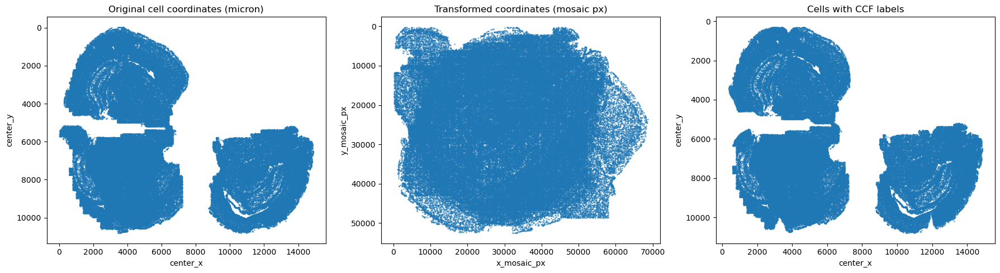


Mapping ratio by sample_id
sample_id
WT1       0.988422
5xFAD1    0.981069
5xFAD3    0.965661
WT3       0.931887
Name: CCF_acronym, dtype: float64


In [43]:
# 6) QC plots for registration and CCF annotation
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(
    adata.obs["center_x"], adata.obs["center_y"],
    s=1, alpha=0.5
)
axes[0].invert_yaxis()
axes[0].set_title("Original cell coordinates (micron)")
axes[0].set_xlabel("center_x")
axes[0].set_ylabel("center_y")

m = adata.obs["x_mosaic_px"].notna() & adata.obs["y_mosaic_px"].notna()
axes[1].scatter(
    adata.obs.loc[m, "x_mosaic_px"],
    adata.obs.loc[m, "y_mosaic_px"],
    s=1, alpha=0.5
)
axes[1].invert_yaxis()
axes[1].set_title("Transformed coordinates (mosaic px)")
axes[1].set_xlabel("x_mosaic_px")
axes[1].set_ylabel("y_mosaic_px")

mapped = adata.obs["CCF_acronym"] != "Not_mapped"
if mapped.sum() > 0:
    axes[2].scatter(
        adata.obs.loc[mapped, "center_x"],
        adata.obs.loc[mapped, "center_y"],
        s=1, alpha=0.5
    )
    axes[2].invert_yaxis()
    axes[2].set_title("Cells with CCF labels")
else:
    axes[2].text(0.5, 0.5, "No CCF-labeled cells\n(check sample_registration)",
                 ha="center", va="center", transform=axes[2].transAxes)
    axes[2].set_title("Cells with CCF labels (none)")
axes[2].set_xlabel("center_x")
axes[2].set_ylabel("center_y")

plt.tight_layout()
plt.show()

print("\nMapping ratio by sample_id")
tmp = (adata.obs["CCF_acronym"] != "Not_mapped").groupby(adata.obs["sample_id"], observed=False).mean()
print(tmp.sort_values(ascending=False))

In [44]:
# 7) Save outputs
modes = set(adata.obs.get("ccf_reg_mode", pd.Series(dtype=str)).astype(str).unique())
if "manual" in modes:
    suffix = "manual"
elif "inferred_coronal_2d" in modes:
    suffix = "inferred"
else:
    suffix = "provisional"

OUT_H5AD = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_annotated.h5ad"
OUT_CSV = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_obs.csv"

adata.write_h5ad(OUT_H5AD)
adata.obs.to_csv(OUT_CSV)

print("Saved:")
print(" -", OUT_H5AD)
print(" -", OUT_CSV)
print("mode:", suffix)
if suffix == "inferred":
    print("[NOTE] This file uses inferred 2D coronal DAPI-to-Allen registration. Review before publication use.")
elif suffix == "provisional":
    print("[NOTE] This file contains provisional CCF mapping only. Use registration before final interpretation.")

Saved:
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_annotated.h5ad
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_obs.csv
mode: inferred
[NOTE] This file uses inferred 2D coronal DAPI-to-Allen registration. Review before publication use.


In [45]:
# 8) Review or edit sample_registration inferred from atlas alignment
print("Current sample_registration:")
for key, value in sample_registration.items():
    print(f"\n{key}")
    print("z_voxel:", value["z_voxel"] )
    print("matrix_2x3:")
    print(np.asarray(value["matrix_2x3"], dtype=float))

print("\n[EDIT HERE IF NEEDED]")
print("Update sample_registration in-place, then rerun cell 9 if you want to rebuild labels explicitly.")

Current sample_registration:

WT1
z_voxel: 30.0
matrix_2x3:
[[2.59381898e-03 0.00000000e+00 1.47293598e+02]
 [0.00000000e+00 2.45092025e-03 1.09831902e+02]]

5xFAD1
z_voxel: 222.0
matrix_2x3:
[[-6.86013720e-03  0.00000000e+00  4.19000000e+02]
 [ 0.00000000e+00  5.02025095e-03  4.50000000e+01]]

WT3
z_voxel: 32.0
matrix_2x3:
[[-2.96753698e-03  0.00000000e+00  3.18705986e+02]
 [ 0.00000000e+00  2.69763601e-03  1.04583338e+02]]

5xFAD3
z_voxel: 258.0
matrix_2x3:
[[-6.16808019e-03  0.00000000e+00  4.35041126e+02]
 [ 0.00000000e+00  6.07960199e-03 -5.16616915e+00]]

[EDIT HERE IF NEEDED]
Update sample_registration in-place, then rerun cell 9 if you want to rebuild labels explicitly.


In [46]:
# 9) Apply sample_registration and rebuild final CCF labels
def _apply_2x3(x, y, m2x3):
    pts = np.column_stack([x, y, np.ones(len(x))])
    out = pts @ np.asarray(m2x3, dtype=float).T
    return out[:, 0], out[:, 1]

def _to_float_or_nan(v):
    try:
        if v is None:
            return np.nan
        return float(v)
    except Exception:
        return np.nan

def _manual_reg_ready(reg):
    if reg is None:
        return False
    m2x3 = np.asarray(reg.get("matrix_2x3", np.full((2, 3), np.nan)), dtype=float)
    z = _to_float_or_nan(reg.get("z_voxel", np.nan))
    return m2x3.shape == (2, 3) and np.isfinite(m2x3).all() and np.isfinite(z)

def _ccf_label_from_id(i):
    if int(i) <= 0:
        return "Not_mapped", "Not_mapped"
    return id_to_acr.get(int(i), "Unknown"), id_to_name.get(int(i), "Unknown")

ready_samples = [
    s for s in adata.obs["sample_id"].astype(str).unique()
    if _manual_reg_ready(sample_registration.get(s, None))
]

if len(ready_samples) == 0:
    raise RuntimeError("No valid sample_registration found. Check cell 3 or edit cell 8 first.")

print("Registration will be applied to:", ready_samples)

for sid in ready_samples:
    smask = adata.obs["sample_id"].astype(str) == sid
    adata.obs.loc[smask, "x_ccf_vox"] = np.nan
    adata.obs.loc[smask, "y_ccf_vox"] = np.nan
    adata.obs.loc[smask, "z_ccf_vox"] = np.nan
    adata.obs.loc[smask, "ccf_id"] = -1
    adata.obs.loc[smask, "CCF_acronym"] = "Not_mapped"
    adata.obs.loc[smask, "CCF_name"] = "Not_mapped"

    reg = sample_registration[sid]
    m2x3 = np.asarray(reg["matrix_2x3"], dtype=float)
    z = _to_float_or_nan(reg["z_voxel"] )

    x_px = adata.obs.loc[smask, "x_mosaic_px"].values
    y_px = adata.obs.loc[smask, "y_mosaic_px"].values
    good = np.isfinite(x_px) & np.isfinite(y_px)
    if good.sum() == 0:
        print(f"[WARN] {sid}: no finite mosaic coordinates")
        continue

    x_vox, y_vox = _apply_2x3(x_px[good], y_px[good], m2x3)
    idx = adata.obs.index[smask][good]
    adata.obs.loc[idx, "x_ccf_vox"] = x_vox
    adata.obs.loc[idx, "y_ccf_vox"] = y_vox
    adata.obs.loc[idx, "z_ccf_vox"] = z
    adata.obs.loc[smask, "ccf_reg_mode"] = "inferred_coronal_2d"

z_max, y_max, x_max = annotation_vol.shape
valid = adata.obs[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
use_rows = valid & (adata.obs["ccf_reg_mode"].astype(str) == "inferred_coronal_2d")

if use_rows.sum() > 0:
    xv = np.rint(adata.obs.loc[use_rows, "x_ccf_vox"].values).astype(int)
    yv = np.rint(adata.obs.loc[use_rows, "y_ccf_vox"].values).astype(int)
    zv = np.rint(adata.obs.loc[use_rows, "z_ccf_vox"].values).astype(int)
    inb = (xv >= 0) & (xv < x_max) & (yv >= 0) & (yv < y_max) & (zv >= 0) & (zv < z_max)
    idx_in = adata.obs.index[use_rows][inb]
    ann = annotation_vol[zv[inb], yv[inb], xv[inb]].astype(int)
    adata.obs.loc[idx_in, "ccf_id"] = ann
    mapped = [_ccf_label_from_id(i) for i in ann]
    adata.obs.loc[idx_in, "CCF_acronym"] = [x[0] for x in mapped]
    adata.obs.loc[idx_in, "CCF_name"] = [x[1] for x in mapped]

print("valid registered CCF vox:", int(use_rows.sum()), "/", adata.n_obs)
print("registered CCF labels:", int(((adata.obs["ccf_id"] > 0) & use_rows).sum()), "/", adata.n_obs)
print(adata.obs["CCF_acronym"].value_counts().head(15))

Registration will be applied to: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
valid registered CCF vox: 136456 / 136456
registered CCF labels: 132144 / 136456
CCF_acronym
MOB           50892
CP            12282
onl           11832
Not_mapped     4312
ccb            1854
PIR            1755
VL             1449
SSs6a          1357
SI             1229
CA3            1202
HY             1147
BST            1082
int            1082
VAL            1009
SSs5            983
Name: count, dtype: int64


Added hierarchy columns: ['CCF_level_0', 'CCF_level_1', 'CCF_level_2', 'CCF_level_3', 'CCF_level_4', 'CCF_level_5', 'CCF_level_6', 'CCF_level_7', 'CCF_level_8', 'CCF_level_9']
Added summary columns:
['CCF_label_count', 'CCF_label_rank', 'CCF_label_in_top20', 'CCF_label_count_top20', 'CCF_confidence']

Top 20 CCF labels:
CCF_acronym
MOB           50892
CP            12282
onl           11832
Not_mapped     4312
ccb            1854
PIR            1755
VL             1449
SSs6a          1357
SI             1229
CA3            1202
HY             1147
int            1082
BST            1082
VAL            1009
SSs5            983
LD              912
STR             862
V3              842
fi              811
SSp-ul6a        795
Name: count, dtype: int64

Confidence summary:
count    136456.000000
mean          0.860549
std           0.250983
min           0.000000
25%           0.800000
50%           1.000000
75%           1.000000
max           1.000000
Name: CCF_confidence, dtype: float6

/tmp/ipykernel_3433422/2216715401.py:77: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sample_order = adata.obs.groupby("sample_id")["CCF_confidence"].median().sort_values(ascending=False).index.tolist()
/tmp/ipykernel_3433422/2216715401.py:79: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(box_data, labels=sample_order, showfliers=False)


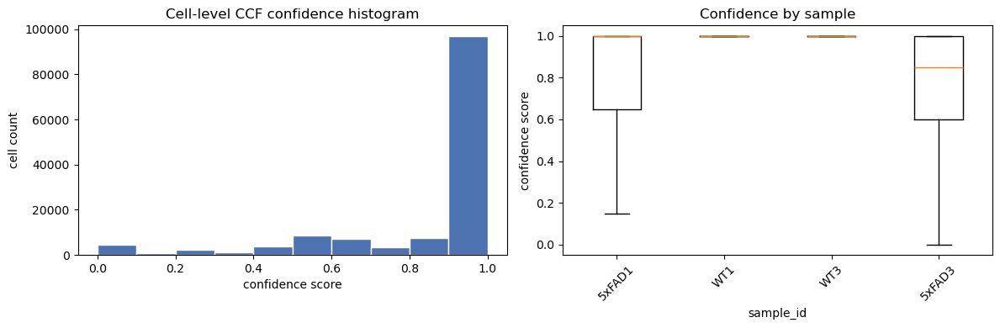

In [47]:
# 10) Add CCF outputs to adata.obs and plot confidence histogram
from sklearn.neighbors import NearestNeighbors

# Hierarchy columns from structure_tree
st_lookup = st[[id_col, "structure_id_path"]].dropna().copy()
st_lookup[id_col] = st_lookup[id_col].astype(int)
id_to_path = dict(zip(st_lookup[id_col], st_lookup["structure_id_path"]))

def _path_names_for_id(ccf_id):
    ccf_id = int(ccf_id)
    if ccf_id <= 0 or ccf_id not in id_to_path:
        return []
    raw = str(id_to_path[ccf_id]).strip().strip("/")
    if raw == "":
        return []
    ids = [int(x) for x in raw.split("/") if x != ""]
    return [id_to_name.get(i, "") for i in ids]

paths = [_path_names_for_id(v) for v in adata.obs["ccf_id"].fillna(-1).astype(int)]
max_depth = max([len(p) for p in paths] + [0])
for level in range(max_depth):
    adata.obs[f"CCF_level_{level}"] = [p[level] if level < len(p) else "" for p in paths]

# Label count summary columns
labels = adata.obs["CCF_acronym"].astype(str)
label_counts = labels.value_counts()
top20_counts = label_counts.head(20)
adata.obs["CCF_label_count"] = labels.map(label_counts).astype("Int64")
adata.obs["CCF_label_rank"] = labels.map({k: i + 1 for i, k in enumerate(label_counts.index)}).astype("Int64")
adata.obs["CCF_label_in_top20"] = labels.isin(set(top20_counts.index))
adata.obs["CCF_label_count_top20"] = labels.map(top20_counts).astype("Int64")

# Cell-level confidence from local CCF-neighborhood label agreement
def _cell_level_confidence(df, k=20):
    df = df.copy()
    df["CCF_acronym"] = df["CCF_acronym"].astype(str)
    valid = (df["CCF_acronym"] != "Not_mapped") & df[["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].notna().all(axis=1)
    conf = pd.Series(np.nan, index=df.index, dtype=float)
    if valid.sum() == 0:
        return conf
    xyz = df.loc[valid, ["x_ccf_vox", "y_ccf_vox", "z_ccf_vox"]].values
    lbl = df.loc[valid, "CCF_acronym"].astype(str).values
    n_neighbors = min(k + 1, len(xyz))
    if n_neighbors <= 1:
        conf.loc[valid] = 1.0
        conf.loc[df.index[~valid]] = 0.0
        return conf
    nn = NearestNeighbors(n_neighbors=n_neighbors)
    nn.fit(xyz)
    _, idx = nn.kneighbors(xyz)
    idx = idx[:, 1:]
    agree = (lbl[idx] == lbl[:, None]).mean(axis=1)
    conf.loc[df.index[valid]] = agree
    conf.loc[df.index[~valid]] = 0.0
    return conf

adata.obs["CCF_confidence"] = np.nan
for sid in adata.obs["sample_id"].astype(str).unique():
    smask = adata.obs["sample_id"].astype(str) == sid
    adata.obs.loc[smask, "CCF_confidence"] = _cell_level_confidence(adata.obs.loc[smask], k=20)
adata.obs["CCF_confidence"] = adata.obs["CCF_confidence"].fillna(0.0).astype(float)

print("Added hierarchy columns:", [f"CCF_level_{i}" for i in range(max_depth)])
print("Added summary columns:")
print(["CCF_label_count", "CCF_label_rank", "CCF_label_in_top20", "CCF_label_count_top20", "CCF_confidence"] )
print("\nTop 20 CCF labels:")
print(top20_counts)
print("\nConfidence summary:")
print(adata.obs["CCF_confidence"].describe())

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(adata.obs["CCF_confidence"], bins=10, color="#4C72B0", edgecolor="white")
axes[0].set_title("Cell-level CCF confidence histogram")
axes[0].set_xlabel("confidence score")
axes[0].set_ylabel("cell count")

sample_order = adata.obs.groupby("sample_id")["CCF_confidence"].median().sort_values(ascending=False).index.tolist()
box_data = [adata.obs.loc[adata.obs["sample_id"] == s, "CCF_confidence"].values for s in sample_order]
axes[1].boxplot(box_data, labels=sample_order, showfliers=False)
axes[1].set_title("Confidence by sample")
axes[1].set_xlabel("sample_id")
axes[1].set_ylabel("confidence score")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

In [48]:
# 11) QC summary and save final outputs
total = adata.n_obs
mapped = int((adata.obs["CCF_acronym"] != "Not_mapped").sum())
not_mapped = int((adata.obs["CCF_acronym"] == "Not_mapped").sum())
print(f"Mapped: {mapped}/{total} ({mapped/total:.3%})")
print(f"Not_mapped: {not_mapped}/{total} ({not_mapped/total:.3%})")

print("\nBy sample (mapped ratio):")
mapped_ratio = (adata.obs["CCF_acronym"] != "Not_mapped").groupby(adata.obs["sample_id"], observed=False).mean()
print(mapped_ratio.sort_values(ascending=False))

print("\nBy sample (mean confidence):")
print(adata.obs.groupby("sample_id")["CCF_confidence"].mean().sort_values(ascending=False))

print("\nccf_reg_mode:")
print(adata.obs["ccf_reg_mode"].value_counts(dropna=False))

print("\nTop 30 labels:")
print(adata.obs["CCF_acronym"].value_counts().head(30))

modes = set(adata.obs.get("ccf_reg_mode", pd.Series(dtype=str)).astype(str).unique())
if "manual" in modes:
    suffix = "manual"
elif "inferred_coronal_2d" in modes:
    suffix = "inferred"
else:
    suffix = "provisional"

OUT_H5AD = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_annotated.h5ad"
OUT_CSV = f"/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_{suffix}_ccf_obs.csv"
adata.write_h5ad(OUT_H5AD)
adata.obs.to_csv(OUT_CSV)

print("\nSaved:")
print(" -", OUT_H5AD)
print(" -", OUT_CSV)
print("mode:", suffix)
if suffix == "inferred":
    print("[NOTE] Current mapping uses inferred sample-wise 2D coronal DAPI/mosaic registration to AllenMouseV3.")
    print("Review sample_registration if you need stricter atlas alignment.")
elif suffix == "provisional":
    print("[NOTE] This file contains provisional CCF mapping only. Use registration before final interpretation.")

Mapped: 132144/136456 (96.840%)
Not_mapped: 4312/136456 (3.160%)

By sample (mapped ratio):
sample_id
WT1       0.988422
5xFAD1    0.981069
5xFAD3    0.965661
WT3       0.931887
Name: CCF_acronym, dtype: float64

By sample (mean confidence):
sample_id
WT1       0.968926
WT3       0.906846
5xFAD1    0.815870
5xFAD3    0.759703
Name: CCF_confidence, dtype: float64

ccf_reg_mode:
ccf_reg_mode
inferred_coronal_2d    136456
Name: count, dtype: int64

Top 30 labels:
CCF_acronym
MOB           50892
CP            12282
onl           11832
Not_mapped     4312
ccb            1854
PIR            1755
VL             1449
SSs6a          1357
SI             1229
CA3            1202
HY             1147
BST            1082
int            1082
VAL            1009
SSs5            983
LD              912
STR             862
V3              842
fi              811
SSp-ul6a        795
TRS             760
SSp-bfd6a       748
GPe             727
MD              719
LPO             713
MPN             655
SSp

/tmp/ipykernel_3433422/1596398415.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(adata.obs.groupby("sample_id")["CCF_confidence"].mean().sort_values(ascending=False))



Saved:
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_annotated.h5ad
 - /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_inferred_ccf_obs.csv
mode: inferred
[NOTE] Current mapping uses inferred sample-wise 2D coronal DAPI/mosaic registration to AllenMouseV3.
Review sample_registration if you need stricter atlas alignment.


/tmp/ipykernel_2750755/641357223.py:45: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


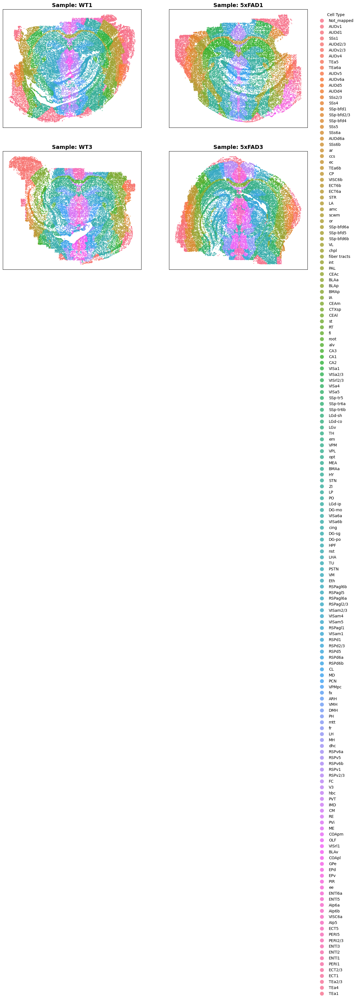

In [58]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["CCF_acronym"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

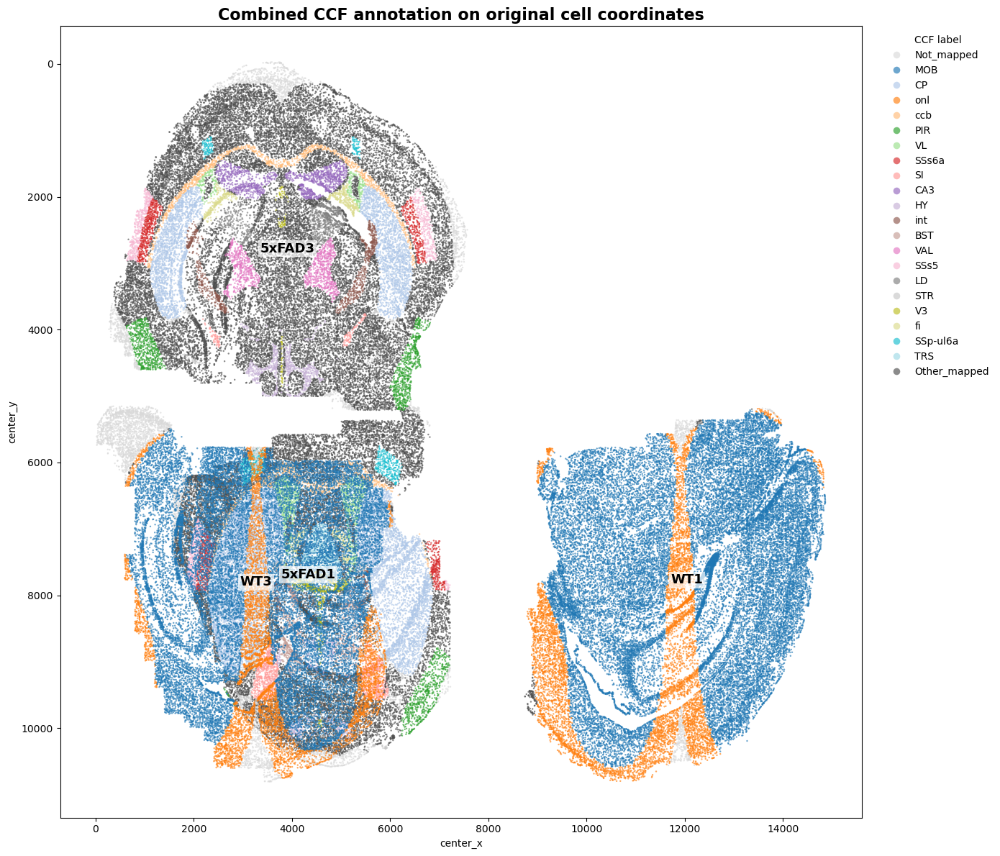

Displayed combined original-coordinate CCF annotation for: ['WT1', '5xFAD1', 'WT3', '5xFAD3']
Top plotted labels: ['MOB', 'CP', 'onl', 'ccb', 'PIR', 'VL', 'SSs6a', 'SI', 'CA3', 'HY', 'int', 'BST', 'VAL', 'SSs5', 'LD', 'STR', 'V3', 'fi', 'SSp-ul6a', 'TRS']


In [54]:
# 12) Combined original-coordinate CCF annotation plot for all 4 samples
sample_order = [s for s in ["WT1", "5xFAD1", "WT3", "5xFAD3"] if s in adata.obs["sample_id"].astype(str).unique()]
plot_df = adata.obs.copy()
plot_df["sample_id"] = plot_df["sample_id"].astype(str)
plot_df = plot_df[plot_df["sample_id"].isin(sample_order)].copy()
plot_df["CCF_plot_label"] = plot_df["CCF_acronym"].astype(str)

top_labels = plot_df.loc[plot_df["CCF_plot_label"] != "Not_mapped", "CCF_plot_label"].value_counts().head(20).index.tolist()
plot_df.loc[(plot_df["CCF_plot_label"] != "Not_mapped") & (~plot_df["CCF_plot_label"].isin(top_labels)), "CCF_plot_label"] = "Other_mapped"

palette = {"Not_mapped": "#d9d9d9", "Other_mapped": "#4d4d4d"}
base_colors = sns.color_palette("tab20", n_colors=max(len(top_labels), 1))
for label, color in zip(top_labels, base_colors):
    palette[label] = color

fig, ax = plt.subplots(figsize=(14, 12))
hue_order = ["Not_mapped"] + top_labels + (["Other_mapped"] if "Other_mapped" in plot_df["CCF_plot_label"].values else [])
sns.scatterplot(
    data=plot_df,
    x="center_x",
    y="center_y",
    hue="CCF_plot_label",
    hue_order=[h for h in hue_order if h in plot_df["CCF_plot_label"].unique()],
    palette=palette,
    s=3,
    linewidth=0,
    alpha=0.65,
    ax=ax,
    legend=True,
 )

for sample_id in sample_order:
    sub = plot_df[plot_df["sample_id"] == sample_id]
    if len(sub) == 0:
        continue
    xmid = float(np.nanmedian(sub["center_x"]))
    ymid = float(np.nanmedian(sub["center_y"]))
    ax.text(xmid, ymid, sample_id, fontsize=13, fontweight="bold", ha="center", va="center", color="black", bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2))

ax.invert_yaxis()
ax.set_title("Combined CCF annotation on original cell coordinates", fontsize=16, fontweight="bold")
ax.set_xlabel("center_x")
ax.set_ylabel("center_y")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", markerscale=4, frameon=False, title="CCF label")
plt.tight_layout()
plt.show()

print("Displayed combined original-coordinate CCF annotation for:", sample_order)
print("Top plotted labels:", top_labels)

In [60]:
ccf_mapping = {
    # Cortex
    "ENTl1":"Cortex",
    "ENTl2":"Cortex",
    "ENTl3":"Cortex",
    "ENTl5":"Cortex",
    "ENTl6a":"Cortex",
    "ECT1":"Cortex",
    "ECT2/3":"Cortex",
    "ECT5":"Cortex",
    "ECT6a":"Cortex",
    "ECT6b":"Cortex",
    "TEa1":"Cortex",
    "TEa2/3":"Cortex",
    "TEa4":"Cortex",
    "TEa5":"Cortex",
    "TEa6a":"Cortex",
    "TEa6b":"Cortex",
    "SSs1":"Cortex",
    "SSs2/3":"Cortex",
    "SSs4":"Cortex",
    "SSs5":"Cortex",
    "SSs6a":"Cortex",
    "SSs6b":"Cortex",
    "SSp-bfd1":"Cortex",
    "SSp-bfd2/3":"Cortex",
    "SSp-bfd4":"Cortex",
    "SSp-bfd5":"Cortex",
    "SSp-bfd6a":"Cortex",
    "SSp-bfd6b":"Cortex",
    "AUDd1":"Cortex",
    "AUDd2/3":"Cortex",
    "AUDd4":"Cortex",
    "AUDd5":"Cortex",
    "AUDd6a":"Cortex",
    "AUDd6b":"Cortex",
    "AUDp1":"Cortex",
    "AUDp2/3":"Cortex",
    "AUDp4":"Cortex",
    "AUDp5":"Cortex",
    "AUDv1":"Cortex",
    "AUDv2/3":"Cortex",
    "AUDv4":"Cortex",
    "AUDv5":"Cortex",
    "AUDv6a":"Cortex",
    "AUDv6b":"Cortex",
    "VISa1":"Cortex",
    "VISa2/3":"Cortex",
    "VISa4":"Cortex",
    "VISa5":"Cortex",
    "VISa6a":"Cortex",
    "VISa6b":"Cortex",
    "VISam1":"Cortex",
    "VISam2/3":"Cortex",
    "VISam4":"Cortex",
    "VISam5":"Cortex",
    "VISam6a":"Cortex",
    "VISam6b":"Cortex",
    "VISrl1":"Cortex",
    "VISrl2/3":"Cortex",
    "VISrl4":"Cortex",
    "VISrl5":"Cortex",
    "VISrl6a":"Cortex",
    "VISrl6b":"Cortex",
    "RSPd1":"Cortex",
    "RSPd2/3":"Cortex",
    "RSPd5":"Cortex",
    "RSPd6a":"Cortex",
    "RSPd6b":"Cortex",
    "RSPv1":"Cortex",
    "RSPv2/3":"Cortex",
    "RSPv5":"Cortex",
    "RSPv6a":"Cortex",
    "RSPv6b":"Cortex",
    "RSPagl1":"Cortex",
    "RSPagl2/3":"Cortex",
    "RSPagl5":"Cortex",
    "RSPagl6a":"Cortex",
    "RSPagl6b":"Cortex",

    # Hippocampus formation
    "CA1":"Hippocampus",
    "CA2":"Hippocampus",
    "CA3":"Hippocampus",
    "DG-mo":"Hippocampus",
    "DG-sg":"Hippocampus",
    "DG-po":"Hippocampus",
    "HPF":"Hippocampus",

    # Striatum
    "CP":"Striatum",
    "STR":"Striatum",
    "GPe":"BasalGanglia",
    "PAL":"BasalGanglia",
    "EPd":"BasalGanglia",
    "EPv":"BasalGanglia",

    # Thalamus
    "TH":"Thalamus",
    "LGd-sh":"Thalamus",
    "LGd-co":"Thalamus",
    "LGd-ip":"Thalamus",
    "LGv":"Thalamus",
    "LP":"Thalamus",
    "VPM":"Thalamus",
    "VPL":"Thalamus",
    "PO":"Thalamus",
    "MD":"Thalamus",

    # Hypothalamus
    "HY":"Hypothalamus",
    "ARH":"Hypothalamus",
    "VMH":"Hypothalamus",
    "DMH":"Hypothalamus",
    "LHA":"Hypothalamus",

    # Amygdala
    "BLAa":"Amygdala",
    "BLAp":"Amygdala",
    "BLAv":"Amygdala",
    "CEAm":"Amygdala",
    "CEAl":"Amygdala",
    "MEA":"Amygdala",

    # Midbrain
    "MB":"Midbrain",
    "ZI":"Midbrain",
    "STN":"Midbrain",
    "RT":"Midbrain",

    # White matter / fiber
    "fiber tracts":"Fiber",
    "ccs":"Fiber",
    "ec":"Fiber",
    "scwm":"Fiber",

    # Not assigned
    "Not_mapped":"Not_mapped",
    "root":"Not_mapped"
}

adata.obs["CCF_major"] = adata.obs["CCF_acronym"].map(ccf_mapping)

/tmp/ipykernel_2750755/641357223.py:45: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


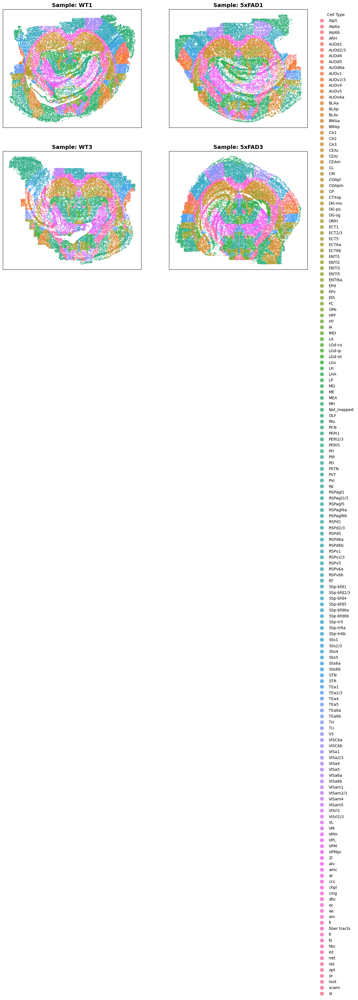

In [65]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["CCF_acronym"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

In [64]:
adata.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")

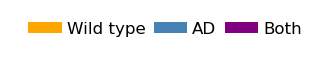

# Spatial Plot (Merscope)

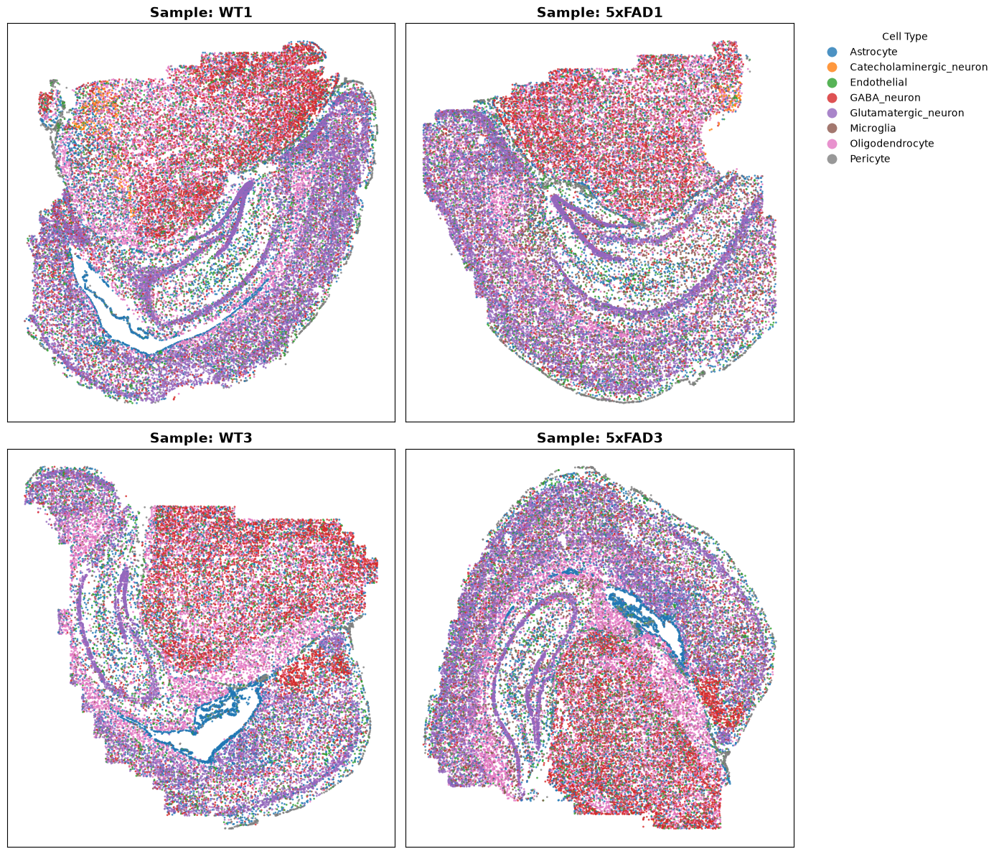

In [68]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["mannual_annotaion"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

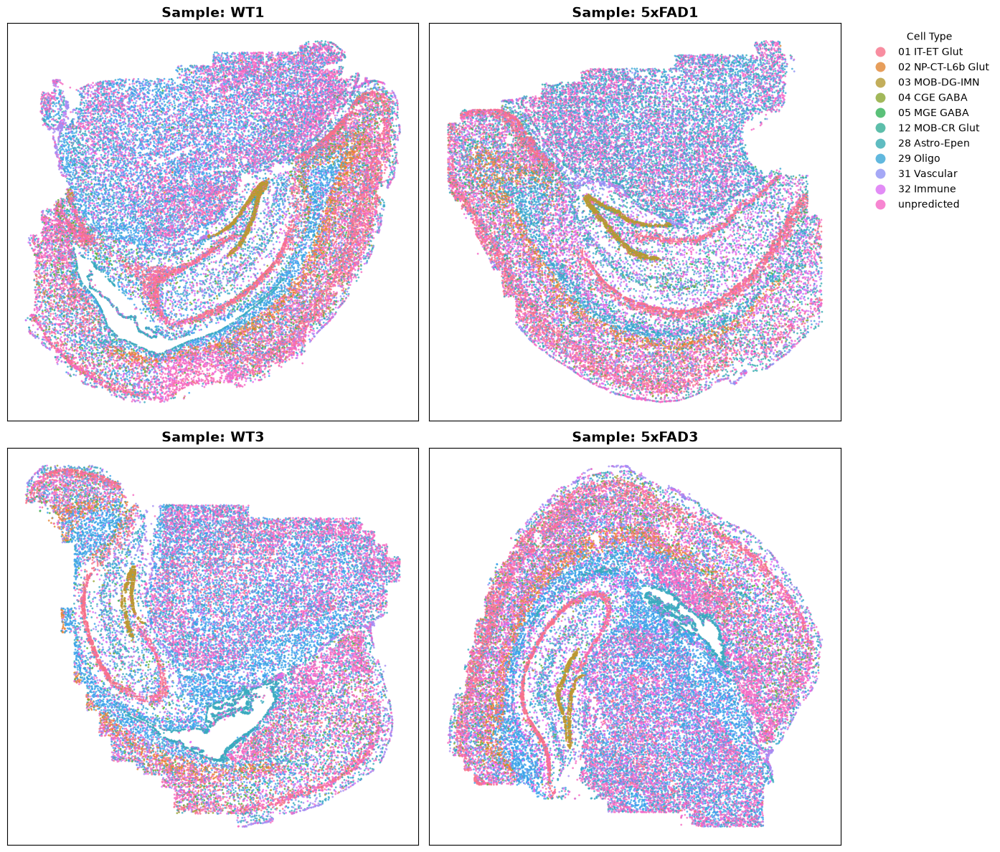

In [69]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["final_label_transfer"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

In [ ]:
################# CCF annotaion ################

In [139]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")

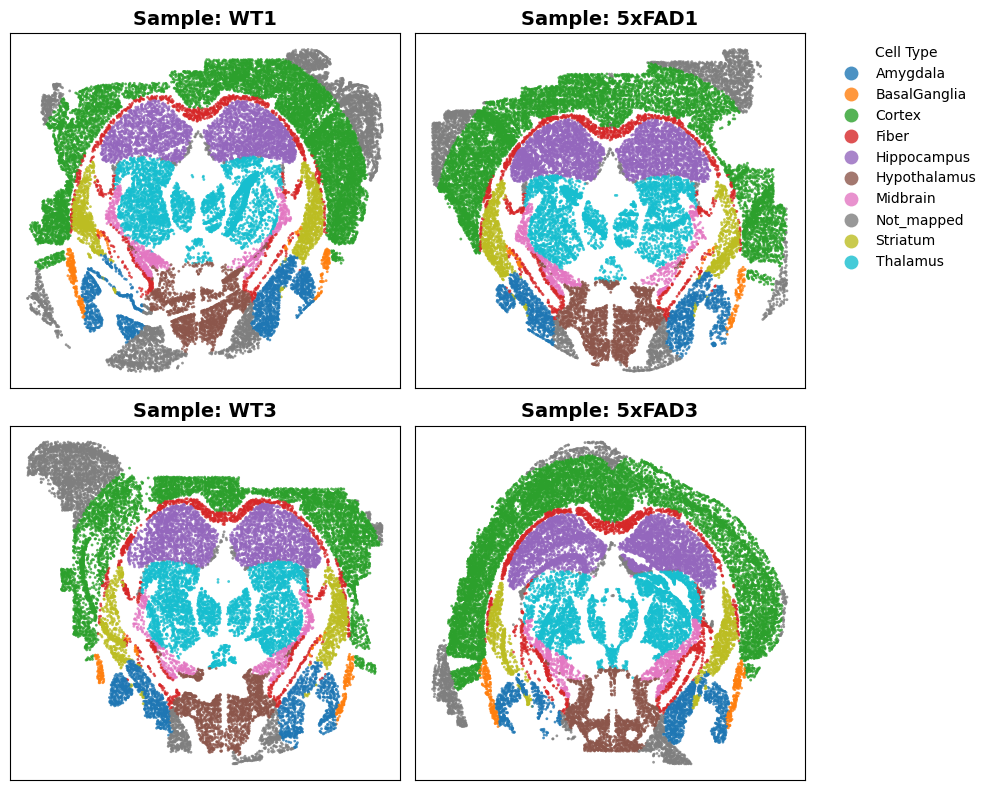

In [140]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["CCF_major"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

/tmp/ipykernel_682153/3392466891.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("CCF_major")["mannual_annotaion"]
/tmp/ipykernel_682153/3392466891.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("CCF_major")["mannual_annotaion"]


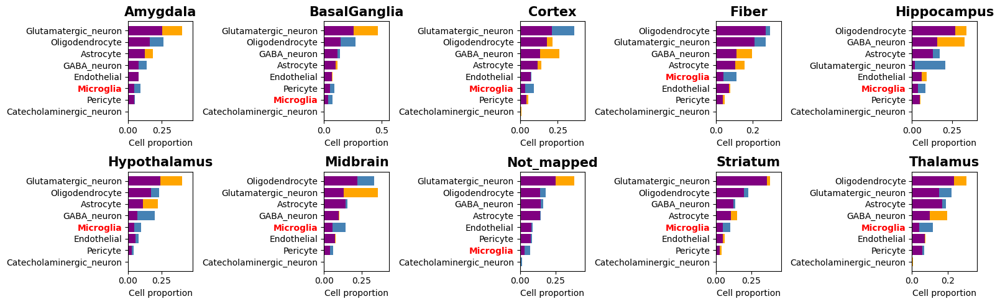

/tmp/ipykernel_682153/3392466891.py:134: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("CCF_major")["mannual_annotaion"]
/tmp/ipykernel_682153/3392466891.py:134: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("CCF_major")["mannual_annotaion"]


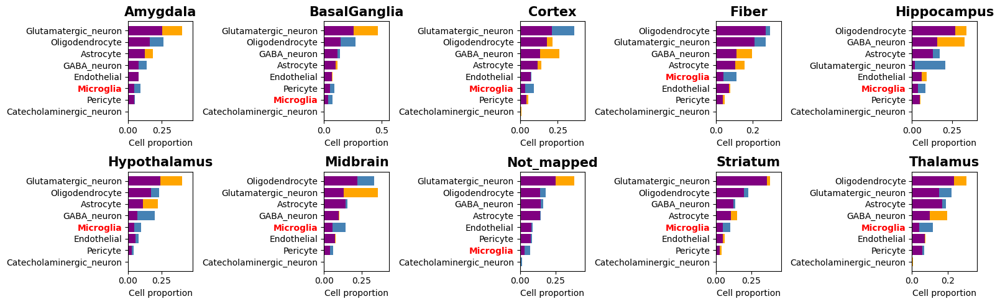

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")
wt = adata[
    adata.obs["sample_id"].str.contains("WT")
].copy()

ad = adata[
    ~adata.obs["sample_id"].str.contains("WT")
].copy()

def get_prop(data):
    return (
        data.obs
        .groupby("CCF_major")["mannual_annotaion"]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
    )

wt_prop = get_prop(wt)
ad_prop = get_prop(ad)

regions = sorted(
    set(wt_prop.index) | set(ad_prop.index)
)

fig, axes = plt.subplots(2, 5, figsize=(16, 5))
axes = axes.flatten()

for i, region in enumerate(regions):

    ax = axes[i]

    wt_values = wt_prop.loc[region] if region in wt_prop.index else pd.Series()
    ad_values = ad_prop.loc[region] if region in ad_prop.index else pd.Series()

    celltypes = sorted(
        set(wt_values.index) | set(ad_values.index)
    )

    wt_values = wt_values.reindex(celltypes, fill_value=0)
    ad_values = ad_values.reindex(celltypes, fill_value=0)

    order = (wt_values + ad_values).sort_values().index

    wt_values = wt_values.loc[order]
    ad_values = ad_values.loc[order]

    y = range(len(order))

    for j, ct in enumerate(order):

        wt = wt_values[ct]
        ad = ad_values[ct]

        overlap = min(wt, ad)

        if wt >= ad:
            ax.barh(
                j,
                overlap,
                color="purple"
            )
            ax.barh(
                j,
                wt - overlap,
                left=overlap,
                color="orange"
            )

        else:
            ax.barh(
                j,
                overlap,
                color="purple"
            )
            ax.barh(
                j,
                ad - overlap,
                left=overlap,
                color="steelblue"
            )

    ax.set_yticks(y)
    ax.set_yticklabels(order)

    for label in ax.get_yticklabels():
        if label.get_text() == "Microglia":
            label.set_color("red")
            label.set_fontweight("bold")

    ax.set_title(
        region,
        fontsize=15,
        fontweight="bold"
    )

    ax.set_xlabel(
        "Cell proportion"
    )

    ax.set_ylabel("")

    ax.set_xlim(
        0,
        max(
            wt_values.max(),
            ad_values.max()
        ) * 1.2
    )

for ax in axes[len(regions):]:
    ax.axis("off")

plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")
wt = adata[
    adata.obs["sample_id"].str.contains("WT")
].copy()

ad = adata[
    ~adata.obs["sample_id"].str.contains("WT")
].copy()

def get_prop(data):
    return (
        data.obs
        .groupby("CCF_major")["mannual_annotaion"]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
    )

wt_prop = get_prop(wt)
ad_prop = get_prop(ad)

regions = sorted(
    set(wt_prop.index) | set(ad_prop.index)
)

fig, axes = plt.subplots(2, 5, figsize=(16, 5))
axes = axes.flatten()

for i, region in enumerate(regions):

    ax = axes[i]

    wt_values = wt_prop.loc[region] if region in wt_prop.index else pd.Series()
    ad_values = ad_prop.loc[region] if region in ad_prop.index else pd.Series()

    celltypes = sorted(
        set(wt_values.index) | set(ad_values.index)
    )

    wt_values = wt_values.reindex(celltypes, fill_value=0)
    ad_values = ad_values.reindex(celltypes, fill_value=0)

    order = (wt_values + ad_values).sort_values().index

    wt_values = wt_values.loc[order]
    ad_values = ad_values.loc[order]

    y = range(len(order))

    for j, ct in enumerate(order):

        wt = wt_values[ct]
        ad = ad_values[ct]

        overlap = min(wt, ad)

        if wt >= ad:
            ax.barh(
                j,
                overlap,
                color="purple"
            )
            ax.barh(
                j,
                wt - overlap,
                left=overlap,
                color="orange"
            )

        else:
            ax.barh(
                j,
                overlap,
                color="purple"
            )
            ax.barh(
                j,
                ad - overlap,
                left=overlap,
                color="steelblue"
            )

    ax.set_yticks(y)
    ax.set_yticklabels(order)

    for label in ax.get_yticklabels():
        if label.get_text() == "Microglia":
            label.set_color("red")
            label.set_fontweight("bold")

    ax.set_title(
        region,
        fontsize=15,
        fontweight="bold"
    )

    ax.set_xlabel(
        "Cell proportion"
    )

    ax.set_ylabel("")

    ax.set_xlim(
        0,
        max(
            wt_values.max(),
            ad_values.max()
        ) * 1.2
    )

for ax in axes[len(regions):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

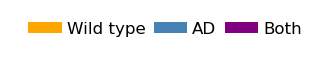

In [5]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

fig, ax = plt.subplots(figsize=(4, 0.5))

legend_elements = [
    Patch(facecolor="orange", label="Wild type"),
    Patch(facecolor="steelblue", label="AD"),
    Patch(facecolor="purple", label="Both")
]

ax.legend(
    handles=legend_elements,
    loc="center",
    frameon=False,
    fontsize=12,
    ncol=3,
    columnspacing=0.5,
    handletextpad=0.3
)

ax.axis("off")

plt.show()